# Includes

In [ ]:
import os
import sys
import time
import glob
import numpy as np
import torch
import torch.nn as nn
import torch.utils
import torch.nn.functional as F
import torchvision.datasets as dset
import torch.backends.cudnn as cudnn
import torchvision.transforms as transforms
from torch.autograd import Variable
from timeit import default_timer as timer
from tqdm import tqdm_notebook
from collections import defaultdict,Counter
import pickle

import scipy.io

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
cd /content/drive/My Drive/Colab Notebooks/huawei

/content/drive/My Drive/Colab Notebooks/huawei


In [ ]:
from DPDBlocks.blocks import AFIR,ABS,Polynomial,Delay,Prod_cmp

In [ ]:
import matplotlib.pyplot as plt

import matplotlib.mlab as mlab
import matplotlib.gridspec as gridspec

# Operations

In [ ]:
def NMSE(X, E):
    return 10*torch.log10((E.norm(dim=1)**2).sum()/(X.norm(dim=1)**2).sum())

In [ ]:
def update_history(hist, iter_num, val_acc, val_loss, time):
    hist['iter'].append(iter_num)
    hist['time'].append(time)
    hist['train_loss'].append(val_loss.item())
        # self.hist['norm_coeffs'].append(train_loss.item())
    hist['train_loss_db'].append(val_acc.item())

## Train Function

In [ ]:
def train_of_epoch(train_queue, model, criterion, optimizer):
    for step, (train) in enumerate(train_queue):

        input_batch = Variable(train[:,:,:1],requires_grad=False).permute(2,1,0).cuda()
        desired = Variable(train[:,:,1:],requires_grad=False).permute(2,1,0).cuda()
        optimizer.zero_grad()
        out = model.forward(input_batch)
        loss = criterion(out, desired)

        loss.backward()

        optimizer.step()


In [ ]:
def eval_model(valid_queue, model, criterion):
    for step, (valid) in enumerate(valid_queue):
        model.eval()
        input_batch = Variable(valid[:,:,:1],requires_grad=False).permute(2,1,0).cuda()
        desired = Variable(valid[:,:,1:],requires_grad=False).permute(2,1,0).cuda()
        out = model.forward(input_batch)


        loss=criterion(out,desired)
        plt.psd(input_batch.detach().cpu()[0,0,:]+
                1j*input_batch.detach().cpu()[0,1,:],NFFT=2048)
        plt.psd(desired.detach().cpu()[0,0,:]+
                1j*desired.detach().cpu()[0,1,:],NFFT=2048)
        # plt.psd(desired.permute(2,1,0).detach().cpu().reshape(-1,),NFFT=2048)
        plt.psd((out-desired).detach().cpu()[0,0,:]+
                1j*(out-desired).detach().cpu()[0,1,:],NFFT=2048)
        # plt.psd((out-desired).permute(2,1,0).detach().cpu().reshape(-1,),NFFT=2048)
        plt.show()

        
        accuracy = NMSE(input_batch, out-desired)
#         print('Loss = ',loss.cpu().detach().numpy(), 'Accuracy = ', accuracy.cpu().detach().numpy(), 'dbs')
    return loss,accuracy
#     return model

In [ ]:
def train(train_queue, valid_queue, model, criterion, optimizer,n_epoch,
          scheduler,log_every=1,save_flag=True,path_to_experiment='/content/drive/My Drive/Colab Notebooks/huawei/new_folder'):
    min_loss=0
    hist=defaultdict(list)
    t0=timer()
    for it in tqdm_notebook(range(n_epoch)):
        model.train(True)
        train_of_epoch(train_queue, model, criterion, optimizer)
        scheduler.step()

    #     if return_history and it % log_every == 0:
    #         model.init_for_batch(train)
    #         train_loss = complex_mse(model.forward(train.x), train.y)
        if it%log_every==0:
            loss_v,accuracy_v=eval_model(valid_queue,net, loss_fn)
            update_history(hist,it, accuracy_v, loss_v, timer() - t0,)
            print('Loss = ',loss_v.cpu().detach().numpy(), 'Accuracy = ', accuracy_v.cpu().detach().numpy(), 'dbs')
            
            if save_flag:
                with open(path_to_experiment + '/hist.pkl', 'wb') as output:
                    pickle.dump(hist, output)

                    torch.save(model.state_dict(), path_to_experiment + '/model.pt')
                if hist['train_loss_db'][-1] < min_loss:
                            min_loss = hist['train_loss_db'][-1]
                            torch.save(model.state_dict(), path_to_experiment + '/best_model.pth')

In [ ]:
global cur_epoh
cur_epoh = 0
global Batch_size
Batch_size=6000

In [ ]:
def my_train(train_queue, valid_queue, model, criterion, optimizer,n_epoch,X, D,
          scheduler,log_every=1,save_flag=True,path_to_experiment=''):
    min_loss=0
    global Batch_size
    global cur_epoh
    hist=defaultdict(list)
    t0=timer()
    cur_epoh = 0
    for it in tqdm_notebook(range(n_epoch)):
        model.train(True)
        train_of_epoch(train_queue, model, criterion, optimizer)
        scheduler.step()
        cur_epoh += 1

        if Batch_size == 13000: # запуск новой учёбы заново
          Batch_size = 3000
          new_train_queue = change_batch(X, D, Batch_size)
          cur_epoh = 0
          my_train(new_train_queue, valid_queue, model, criterion, optimizer,n_epoch,X, D,
            scheduler,log_every=5,save_flag=True,path_to_experiment='/content/drive/My Drive/Colab Notebooks/huawei/new_folder')

        
        if cur_epoh % 100 == 0: #смена размера batch
          Batch_size += 1000
          new_train_queue = change_batch(X, D, Batch_size)
          cur_epoh = 0
          my_train(new_train_queue, valid_queue, model, criterion, optimizer,n_epoch,X, D,
            scheduler,log_every=5,save_flag=True,path_to_experiment='/content/drive/My Drive/Colab Notebooks/huawei/new_folder')

          
        

        if it%log_every==0:
            loss_v,accuracy_v=eval_model(valid_queue,net, loss_fn)
            update_history(hist,it, accuracy_v, loss_v, timer() - t0,)
            print('Loss = ',loss_v.cpu().detach().numpy(), 'Accuracy = ', accuracy_v.cpu().detach().numpy(), 'dbs')
            print('cur_batch = ', Batch_size)

            if save_flag:
                with open(path_to_experiment + '/hist.pkl', 'wb') as output:
                    pickle.dump(hist, output)

                    torch.save(model.state_dict(), path_to_experiment + '/n_model.pt')
                if hist['train_loss_db'][-1] < min_loss:
                            min_loss = hist['train_loss_db'][-1]
                            torch.save(model.state_dict(), path_to_experiment + '/best_n_model.pth')

In [ ]:
def change_batch(X, D, Batch_size):
  train_queue = torch.utils.data.DataLoader(
    torch.cat((X,D),dim=-1), batch_size=Batch_size)#, pin_memory=True)

  # valid_queue = torch.utils.data.DataLoader(
  #   torch.cat((X,D),dim=-1), batch_size=X.shape[0])#,pin_memory=True)
  return train_queue

In [ ]:
def draw_spectrum(input_batch,desired,out):
  plt.psd(input_batch.detach().cpu()[0,0,:]+
                1j*input_batch.detach().cpu()[0,1,:],NFFT=2048)
  plt.psd(desired.detach().cpu()[0,0,:]+
                1j*desired.detach().cpu()[0,1,:],NFFT=2048)
        # plt.psd(desired.permute(2,1,0).detach().cpu().reshape(-1,),NFFT=2048)
  plt.psd((out-desired).detach().cpu()[0,0,:]+
                1j*(out-desired).detach().cpu()[0,1,:],NFFT=2048)
        # plt.psd((out-desired).permute(2,1,0).detach().cpu().reshape(-1,),NFFT=2048)
  plt.show()



# Data preprocess

In [ ]:
np.random.seed()
# torch.cuda.set_device()
cudnn.benchmark = True
torch.manual_seed(10)
cudnn.enabled=True
torch.cuda.manual_seed(10)

In [ ]:
Batch_size=10000

In [ ]:
name = 'BlackBoxData_80'
# name = 'BlackBoxData'
# name = '../BlackBoxData/data1'
mat = scipy.io.loadmat(name)
x = np.array(mat['x']).reshape(-1,1)/2**15
d = np.array(mat['y']).reshape(-1,1)/2**15
# x = np.array(mat['xE']).reshape(-1,1)/2**15
# d = np.array(mat['d']).reshape(-1,1)/2**15
# x, d = mat['xE'], mat['d']

x_real, x_imag = torch.from_numpy(np.real(x)), torch.from_numpy(np.imag(x))
d_real, d_imag = torch.from_numpy(np.real(d)), torch.from_numpy(np.imag(d))
print(x_real.shape)

X = torch.DoubleTensor(torch.cat((x_real, x_imag), dim=1)).reshape(-1,2,1)
D = torch.DoubleTensor(torch.cat((d_real, d_imag), dim=1)).reshape(-1,2,1)

train_queue = torch.utils.data.DataLoader(
    torch.cat((X,D),dim=-1), batch_size=Batch_size)#, pin_memory=True)

valid_queue = torch.utils.data.DataLoader(
    torch.cat((X,D),dim=-1), batch_size=X.shape[0])#,pin_memory=True)

torch.Size([99840, 1])


## Loss function

In [ ]:
loss_fn = nn.MSELoss()

# Model

In [ ]:
class Cell(nn.Module):
    def __init__(self,M=15,D=0,Poly_order=8,Passthrough=False):
        super(Cell,self).__init__()
        self.f1=AFIR(M,0)
        self.f2=AFIR(M,0)
        self.delay=Delay(D)
        self.pol=Polynomial(Poly_order,True) # было Passthrough
        self.prod=Prod_cmp()
    def forward(self,x):
        x=self.delay(x)
        up=self.f1(x) 
        return self.prod(up,self.f2(self.pol(x)))

In [ ]:
class Sasha_Cell(nn.Module):
    def __init__(self,M=15,D=0,Poly_order=8,Passthrough=False):
        super(Sasha_Cell,self).__init__()
        self.f1=AFIR(M,0)
        self.f2=AFIR(M,1)
        self.f3=AFIR(M,0)
        self.f4=AFIR(M,1)
        self.pol1=Polynomial(Poly_order,True) # было Passthrough
        self.pol2=Polynomial(Poly_order,True) # было Passthrough
        self.delay=Delay(D)
        self.prod=Prod_cmp()
    def forward(self,x):
        x=self.delay(x)
        lis = self.f1(self.pol1(x)) + self.f2(x)
        sah = self.f3(self.pol2(x)) + self.f4(x)
        return self.prod(lis, sah)

In [ ]:
class sasha_layer(nn.Module):
    def __init__(self, delay,sasha_delay, width):
        super(sasha_layer, self).__init__()
        self.Cells = nn.ModuleList()
        for i in range(width):
            self.Cells.append(Cell(D=delay[i]))
            self.Cells.append(Sasha_Cell(D=sasha_delay[i]))

    def forward(self, x):
        out = torch.zeros_like(x)
        for i in range(len(self.Cells)):
            out += self.Cells[i](x)
        return out

In [ ]:
net = sasha_layer([1,0,1],[0,1,0],3)
# net
net=net.to("cuda:0")
optimizer = torch.optim.Adam(net.parameters(), lr=1e-2)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=0.999)
my_train(train_queue, valid_queue, net, loss_fn, optimizer,102,X,D,scheduler,save_flag=False)

Этот слой обучился до точности -39.2, поэтому решил сделать модель из этих слоёв


In [ ]:
class Sasha_Model(nn.Module):
    def __init__(self, layers, width, delay, sasha_delay):
        super(Sasha_Model, self).__init__()
        self.layers = nn.ModuleList()
        for i in range(layers):
            self.layers.append(sasha_layer(delay[i], sasha_delay[i], width))
    def forward(self, x):
        out = x.clone()
        for i in range(len(self.layers)):
            out = self.layers[i](out) + x
        return out

In [ ]:
#net = Sasha_Model(2,4,[[3,0,5,2],[4,2,6,1]],[[2,7,3,0],[5,1,3,7]])  #[1,0,1],[0,1,0]
# net
net=net.to("cuda:0")
optimizer = torch.optim.Adam(net.parameters(), lr=1e-2)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=0.97)
my_train(train_queue, valid_queue, net, loss_fn, optimizer,102,X,D,scheduler,save_flag=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  9.460302048399719e-05 Accuracy =  -25.286350239165568 dbs
cur_batch =  1000
Loss =  5.533398768263571e-05 Accuracy =  -27.61548057609813 dbs
cur_batch =  1000
Loss =  5.821458260689005e-05 Accuracy =  -27.39508238732173 dbs
cur_batch =  1000
Loss =  3.8988854442629714e-05 Accuracy =  -29.13599551606773 dbs
cur_batch =  1000
Loss =  3.473524227910854e-05 Accuracy =  -29.637696942533623 dbs
cur_batch =  1000
Loss =  2.8144994921211688e-05 Accuracy =  -30.551388520608164 dbs
cur_batch =  1000
Loss =  2.7162989717702103e-05 Accuracy =  -30.70562457455246 dbs
cur_batch =  1000
Loss =  2.377913874919786e-05 Accuracy =  -31.283439057261845 dbs
cur_batch =  1000
Loss =  2.2549204227419156e-05 Accuracy =  -31.514088066710997 dbs
cur_batch =  1000
Loss =  2.1396336346906642e-05 Accuracy =  -31.742006103733964 dbs
cur_batch =  1000
Loss =  1.923462055276497e-05 Accuracy =  -32.20456403420799 dbs
cur_batch =  1000
Loss =  1.932081972990589e-05 Accuracy =  -32.185144782825425 dbs
cur_batch 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  7.3685050730870275e-06 Accuracy =  -36.37160639828323 dbs
cur_batch =  2000
Loss =  6.596346189000941e-06 Accuracy =  -36.852365865035864 dbs
cur_batch =  2000
Loss =  6.6306983125981405e-06 Accuracy =  -36.829807581118445 dbs
cur_batch =  2000
Loss =  6.3140770972757936e-06 Accuracy =  -37.042301461993425 dbs
cur_batch =  2000
Loss =  6.813373908164919e-06 Accuracy =  -36.71177803638032 dbs
cur_batch =  2000
Loss =  6.370217351899472e-06 Accuracy =  -37.003857759666715 dbs
cur_batch =  2000
Loss =  6.977874808369876e-06 Accuracy =  -36.608168532817714 dbs
cur_batch =  2000
Loss =  6.328201018236961e-06 Accuracy =  -37.032597604140896 dbs
cur_batch =  2000
Loss =  7.296312072954138e-06 Accuracy =  -36.41436625619046 dbs
cur_batch =  2000
Loss =  6.466831114700062e-06 Accuracy =  -36.93848507462406 dbs
cur_batch =  2000
Loss =  6.229138346647027e-06 Accuracy =  -37.10112050201929 dbs
cur_batch =  2000
Loss =  6.181016403515806e-06 Accuracy =  -37.13480130540683 dbs
cur_batch =  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  5.397929994629633e-06 Accuracy =  -37.723127787654775 dbs
cur_batch =  3000
Loss =  5.500058788919487e-06 Accuracy =  -37.641726950909224 dbs
cur_batch =  3000
Loss =  5.344411533352094e-06 Accuracy =  -37.76640134147664 dbs
cur_batch =  3000
Loss =  5.402626774699465e-06 Accuracy =  -37.719350601275984 dbs
cur_batch =  3000
Loss =  5.525772224134613e-06 Accuracy =  -37.6214704763511 dbs
cur_batch =  3000
Loss =  5.440902839046457e-06 Accuracy =  -37.68869056129277 dbs
cur_batch =  3000
Loss =  5.221020444946839e-06 Accuracy =  -37.86784632824348 dbs
cur_batch =  3000
Loss =  5.098262335446424e-06 Accuracy =  -37.971178479862274 dbs
cur_batch =  3000
Loss =  5.12154451319953e-06 Accuracy =  -37.95139075008023 dbs
cur_batch =  3000
Loss =  5.208415833288798e-06 Accuracy =  -37.87834376225388 dbs
cur_batch =  3000
Loss =  5.221536167410875e-06 Accuracy =  -37.86741736160471 dbs
cur_batch =  3000
Loss =  5.1622304468112035e-06 Accuracy =  -37.91702638734439 dbs
cur_batch =  3000
L

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  5.129216619648727e-06 Accuracy =  -37.944889858928 dbs
cur_batch =  4000
Loss =  4.58683060994859e-06 Accuracy =  -38.43027324603553 dbs
cur_batch =  4000
Loss =  4.546571919964865e-06 Accuracy =  -38.468559613217145 dbs
cur_batch =  4000
Loss =  4.518680088408869e-06 Accuracy =  -38.49528431264705 dbs
cur_batch =  4000
Loss =  4.497030235792447e-06 Accuracy =  -38.51614219130595 dbs
cur_batch =  4000
Loss =  4.478646019251712e-06 Accuracy =  -38.53393288414301 dbs
cur_batch =  4000
Loss =  4.455542653210241e-06 Accuracy =  -38.55639421134046 dbs
cur_batch =  4000
Loss =  4.424067276384332e-06 Accuracy =  -38.5871830406512 dbs
cur_batch =  4000
Loss =  4.4078004622481406e-06 Accuracy =  -38.60318100578175 dbs
cur_batch =  4000
Loss =  4.3932300799091875e-06 Accuracy =  -38.61756078187685 dbs
cur_batch =  4000
Loss =  4.3784928505129655e-06 Accuracy =  -38.63215381788151 dbs
cur_batch =  4000
Loss =  4.363868255562053e-06 Accuracy =  -38.64668395850318 dbs
cur_batch =  4000
Loss

In [ ]:
model = Sasha_Model(2,4,[[3,0,5,2],[4,2,6,1]],[[2,7,3,0],[5,1,3,7]])
model.load_state_dict(torch.load('/content/drive/My Drive/Colab Notebooks/huawei/new_folder/best_n_model.pth'))
model.eval()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


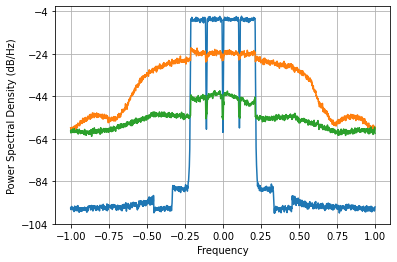

Loss =  9.159555438522045e-06 Accuracy =  -35.42665631107943 dbs


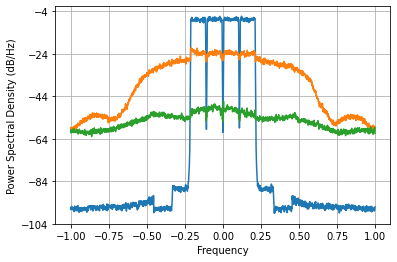

Loss =  3.7358019932168318e-06 Accuracy =  -39.321561772062495 dbs


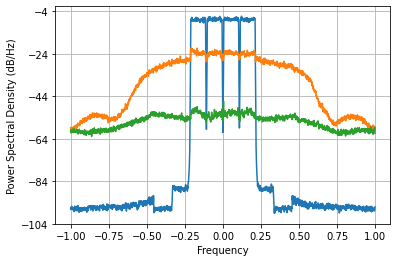

Loss =  3.2383281810898986e-06 Accuracy =  -39.942191674425565 dbs


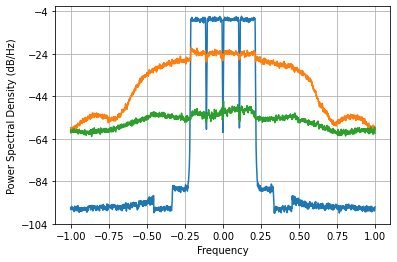

Loss =  3.3930936132772616e-06 Accuracy =  -39.73944184971526 dbs


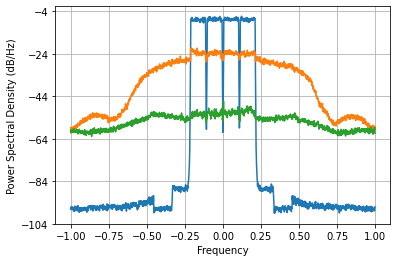

Loss =  3.271895480543914e-06 Accuracy =  -39.89740604839329 dbs


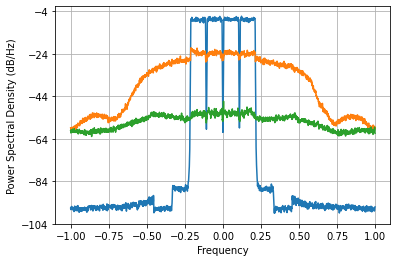

Loss =  3.19953709487236e-06 Accuracy =  -39.99452877019824 dbs


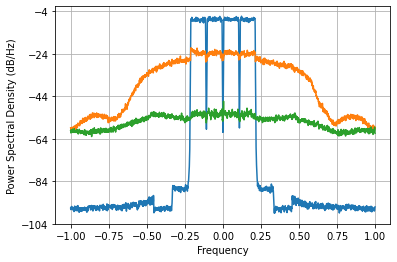

Loss =  3.0819616646161883e-06 Accuracy =  -40.15712794301031 dbs


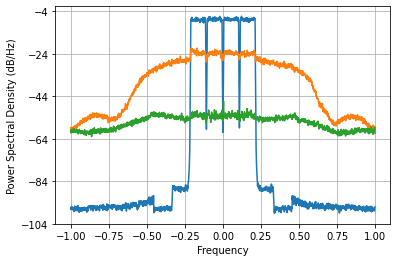

Loss =  2.9356908877212123e-06 Accuracy =  -40.36829701883028 dbs


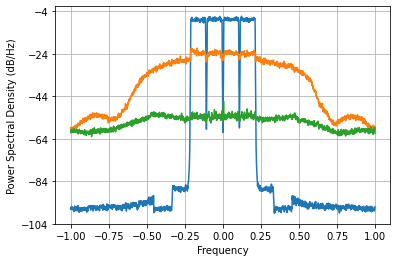

Loss =  2.850325656062373e-06 Accuracy =  -40.49645544731937 dbs


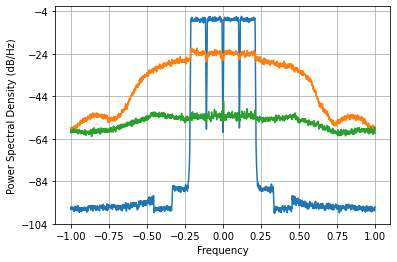

Loss =  2.8641495163072297e-06 Accuracy =  -40.47544341120752 dbs


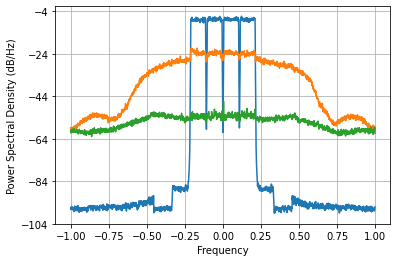

Loss =  2.885639276582123e-06 Accuracy =  -40.44297986133543 dbs


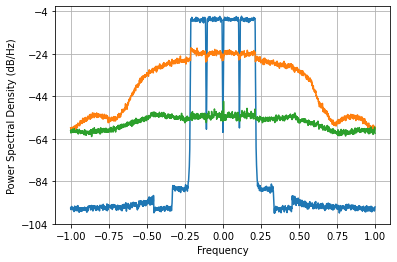

Loss =  2.897414744256704e-06 Accuracy =  -40.425293608769685 dbs


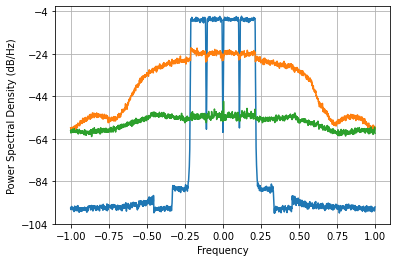

Loss =  2.884366324240158e-06 Accuracy =  -40.44489610275721 dbs


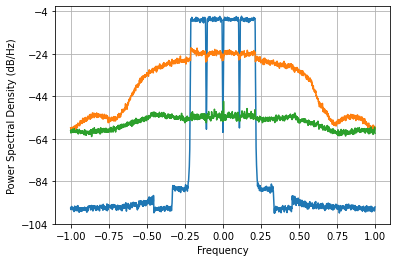

Loss =  2.858780076485068e-06 Accuracy =  -40.48359279949586 dbs


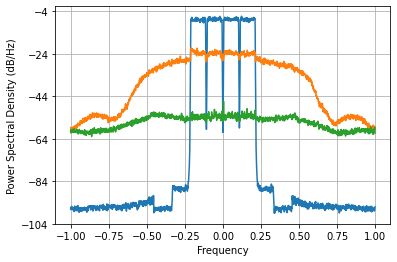

Loss =  2.8394881443945753e-06 Accuracy =  -40.512999669579855 dbs


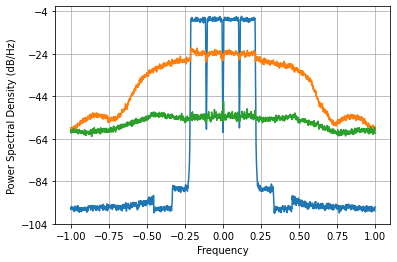

Loss =  2.8280399004930072e-06 Accuracy =  -40.53054494108743 dbs


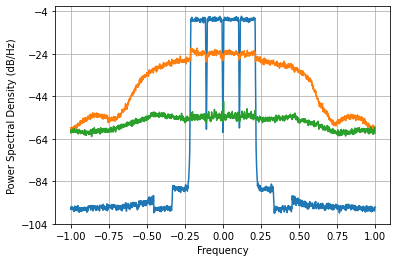

Loss =  2.830472990126326e-06 Accuracy =  -40.5268101171601 dbs


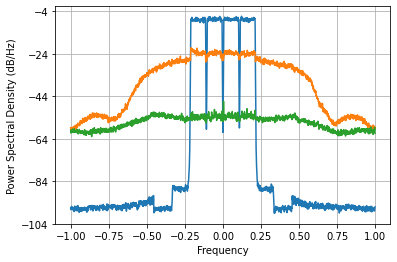

Loss =  2.8296241236532406e-06 Accuracy =  -40.52811277335305 dbs


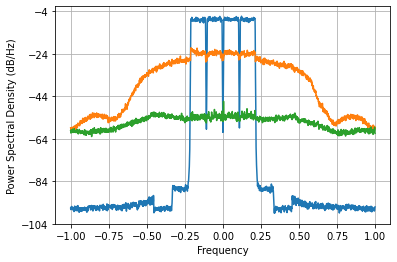

Loss =  2.822758937008391e-06 Accuracy =  -40.53866235610841 dbs


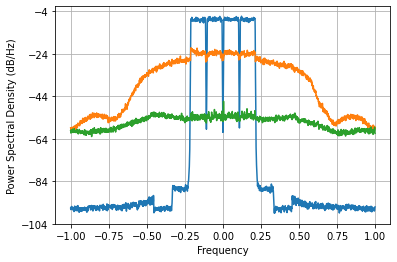

Loss =  2.8178160902789153e-06 Accuracy =  -40.54627381982832 dbs


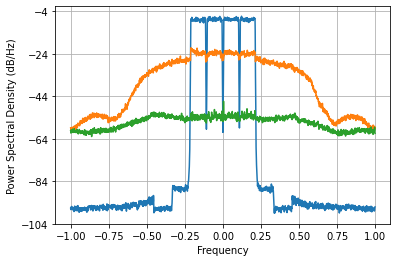

Loss =  2.814786119551567e-06 Accuracy =  -40.55094625947565 dbs


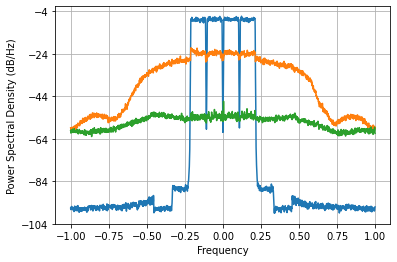

Loss =  2.8170724414264497e-06 Accuracy =  -40.5474201161327 dbs


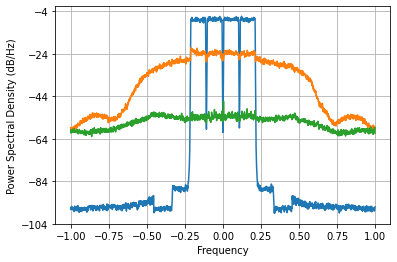

Loss =  2.814088750040596e-06 Accuracy =  -40.55202236700701 dbs


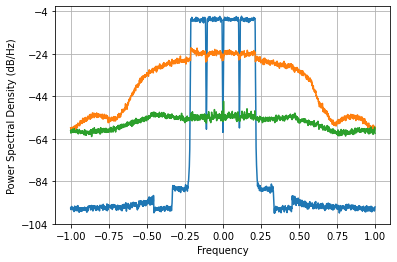

Loss =  2.8113209726574733e-06 Accuracy =  -40.55629594209176 dbs


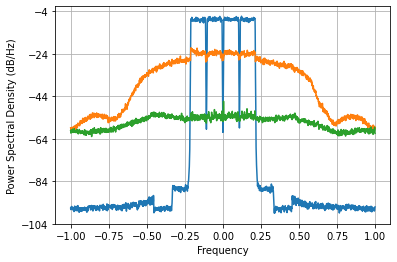

Loss =  2.8112302656154625e-06 Accuracy =  -40.55643606911293 dbs


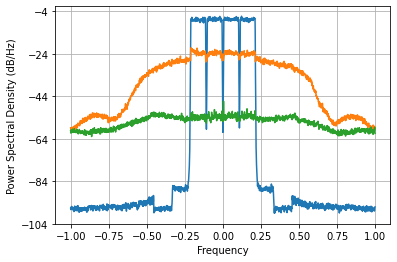

Loss =  2.809534505980523e-06 Accuracy =  -40.55905656331384 dbs


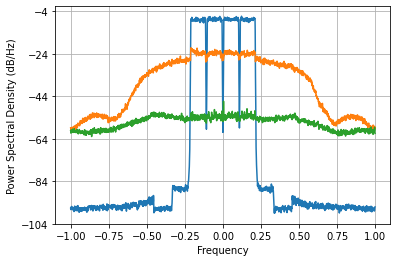

Loss =  2.8103767495723093e-06 Accuracy =  -40.55775482835599 dbs


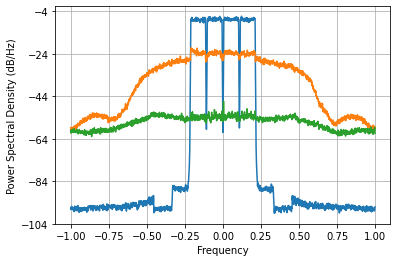

Loss =  2.8080907156143163e-06 Accuracy =  -40.56128893082908 dbs


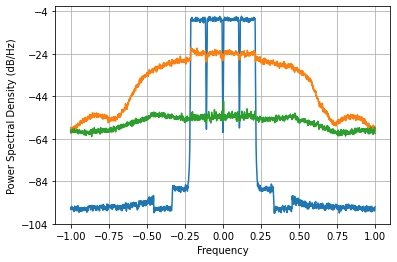

Loss =  2.8068109137035172e-06 Accuracy =  -40.56326870163936 dbs


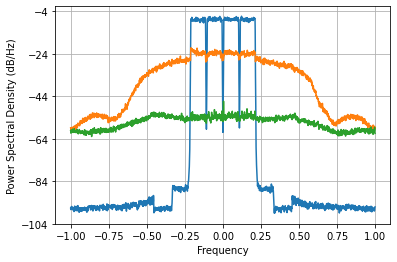

Loss =  2.8058034318517888e-06 Accuracy =  -40.56482784604724 dbs


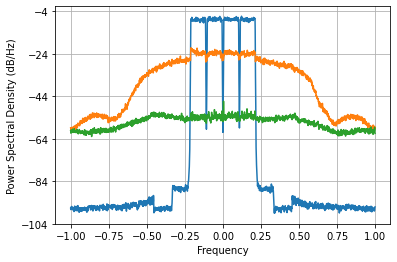

Loss =  2.802878675185625e-06 Accuracy =  -40.569357273003234 dbs


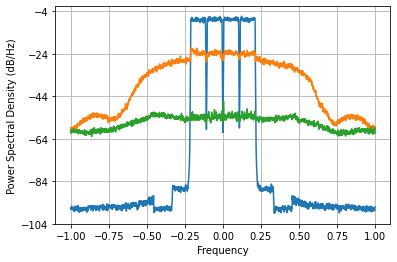

Loss =  2.8020758810448287e-06 Accuracy =  -40.570601347560256 dbs


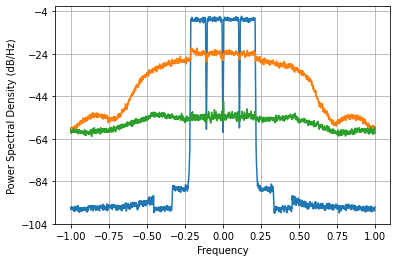

Loss =  2.7997094630407764e-06 Accuracy =  -40.57427061469223 dbs


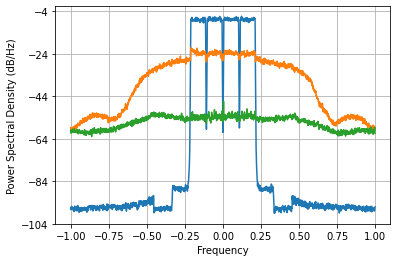

Loss =  2.7988198556629125e-06 Accuracy =  -40.57565080422604 dbs


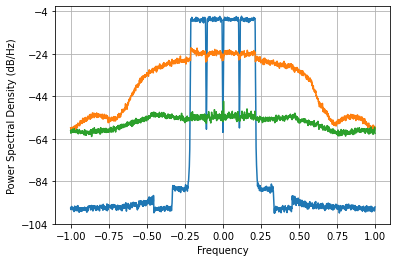

Loss =  2.798885219174117e-06 Accuracy =  -40.57554938047521 dbs


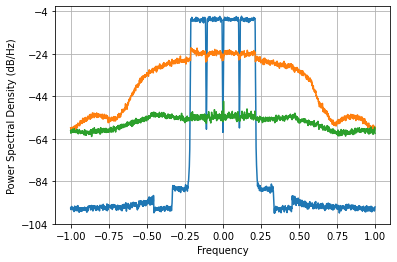

Loss =  2.7962215812182646e-06 Accuracy =  -40.57968443417366 dbs


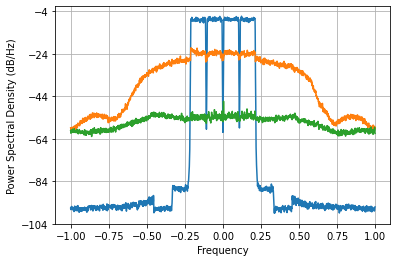

Loss =  2.795994832803851e-06 Accuracy =  -40.5800366222076 dbs


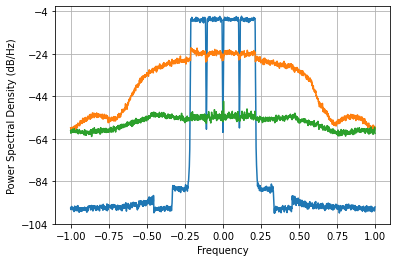

Loss =  2.7955740490531388e-06 Accuracy =  -40.58069026366393 dbs


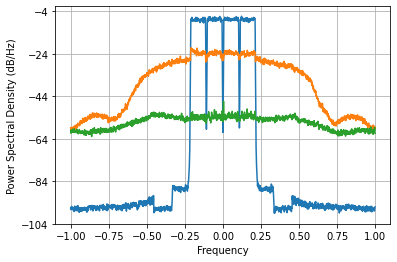

Loss =  2.7964002833765518e-06 Accuracy =  -40.57940689221514 dbs


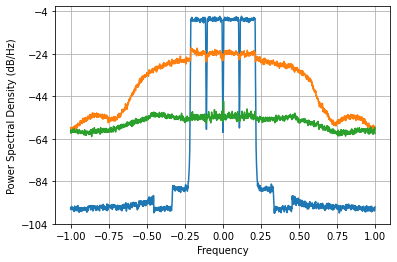

Loss =  2.7972949319402216e-06 Accuracy =  -40.578017681960375 dbs


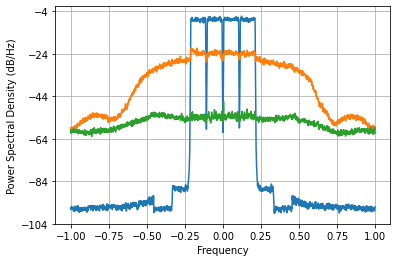

Loss =  2.793249590678373e-06 Accuracy =  -40.58430282891507 dbs


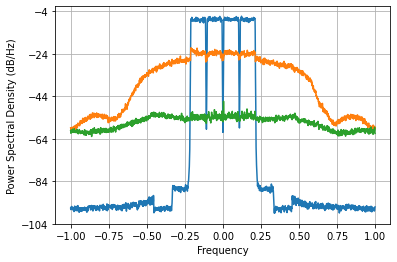

Loss =  2.7925097874052265e-06 Accuracy =  -40.58545322748885 dbs


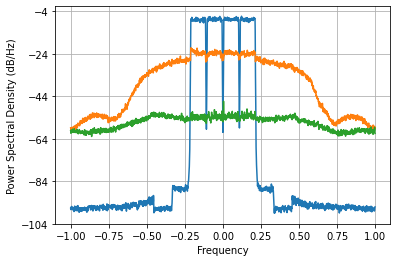

Loss =  2.792286216308862e-06 Accuracy =  -40.58580094186715 dbs


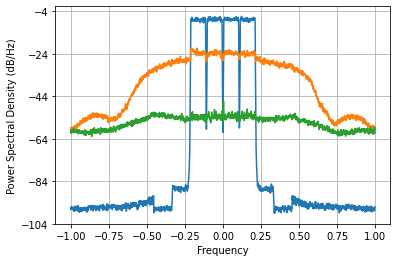

Loss =  2.793085190455474e-06 Accuracy =  -40.584558445924955 dbs


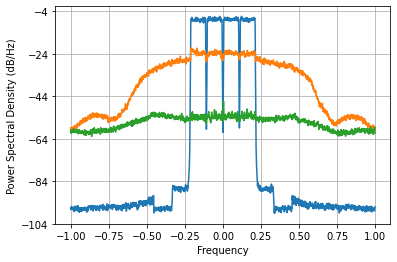

Loss =  2.7937903331524352e-06 Accuracy =  -40.58346216381673 dbs


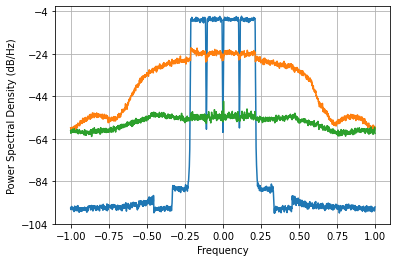

Loss =  2.788912817987397e-06 Accuracy =  -40.591050883486055 dbs


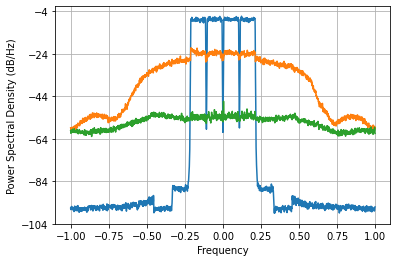

Loss =  2.787980087264999e-06 Accuracy =  -40.59250359135224 dbs


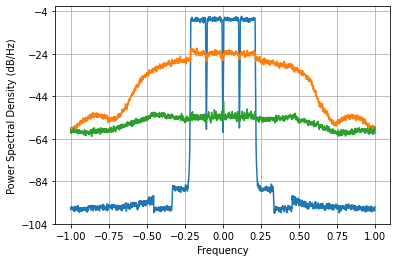

Loss =  2.7878301429958084e-06 Accuracy =  -40.592737171642916 dbs


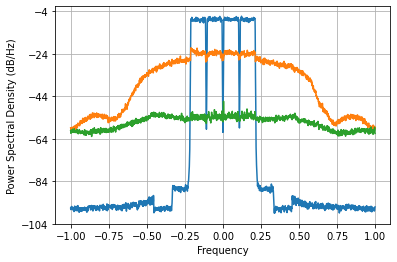

Loss =  2.7884690141383867e-06 Accuracy =  -40.59174203775478 dbs


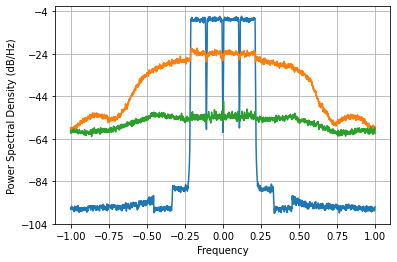

Loss =  2.7888676933124214e-06 Accuracy =  -40.59112115300383 dbs


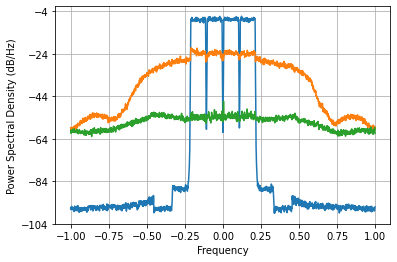

Loss =  2.783926738042852e-06 Accuracy =  -40.5988222451493 dbs


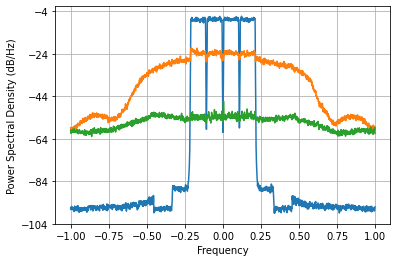

Loss =  2.7830814365777058e-06 Accuracy =  -40.60014112147628 dbs


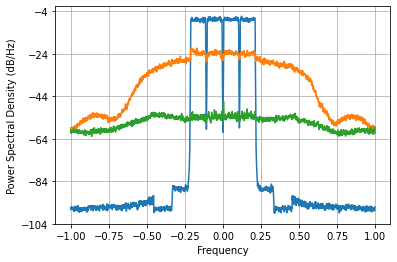

Loss =  2.782942502833833e-06 Accuracy =  -40.6003579303114 dbs


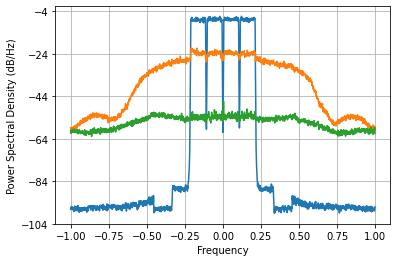

Loss =  2.7833901965683505e-06 Accuracy =  -40.59965933420008 dbs


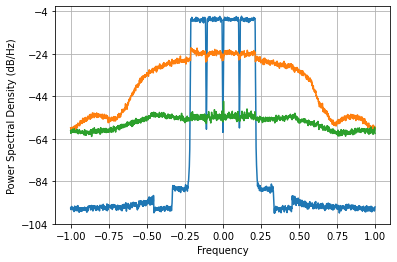

Loss =  2.7835575841826023e-06 Accuracy =  -40.59939816588993 dbs


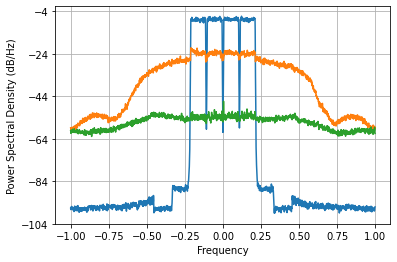

Loss =  2.7789524405805897e-06 Accuracy =  -40.60658912429811 dbs


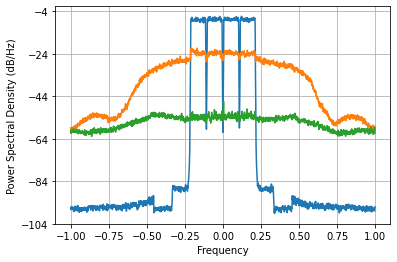

Loss =  2.7782670369354746e-06 Accuracy =  -40.60766040472409 dbs


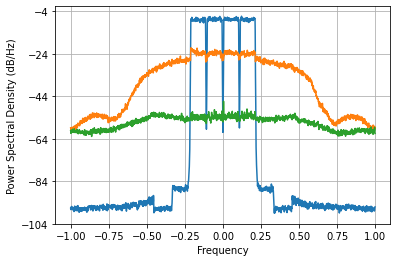

Loss =  2.778063604581678e-06 Accuracy =  -40.60797841873167 dbs


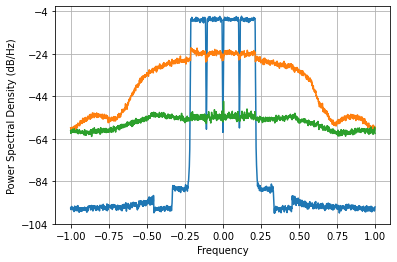

Loss =  2.7782967249579584e-06 Accuracy =  -40.60761399710639 dbs


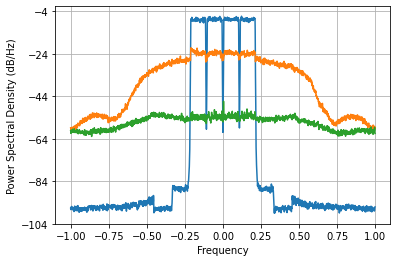

Loss =  2.778295654850861e-06 Accuracy =  -40.60761566986399 dbs


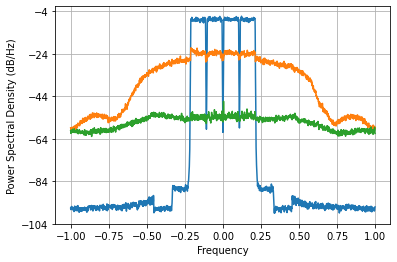

Loss =  2.7740784632039826e-06 Accuracy =  -40.614212860091506 dbs


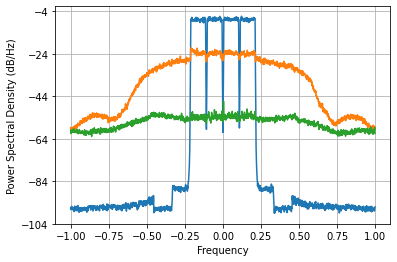

Loss =  2.7734933296886734e-06 Accuracy =  -40.61512900959728 dbs


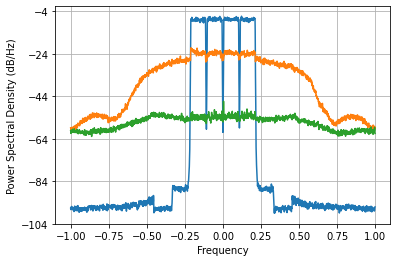

Loss =  2.7731607449686786e-06 Accuracy =  -40.615649827037444 dbs


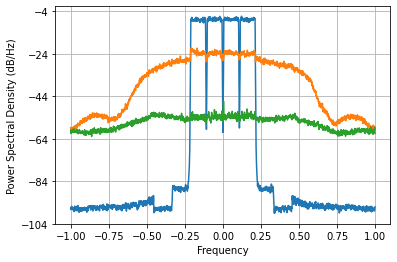

Loss =  2.7731863187447106e-06 Accuracy =  -40.61560977707416 dbs


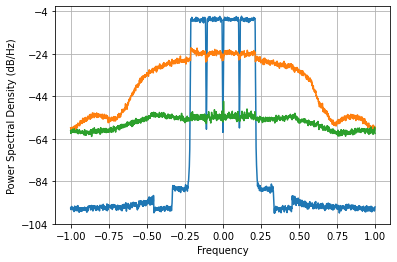

Loss =  2.7730563822868635e-06 Accuracy =  -40.61581326866188 dbs


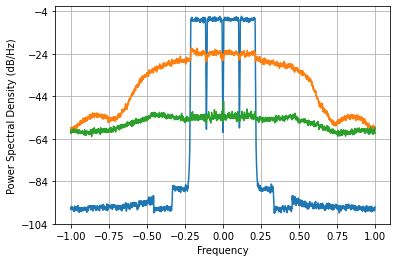

Loss =  2.769222612005451e-06 Accuracy =  -40.621821575155934 dbs


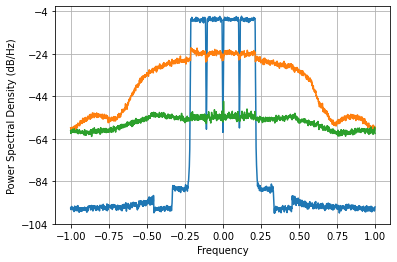

Loss =  2.768689874369515e-06 Accuracy =  -40.62265714277052 dbs


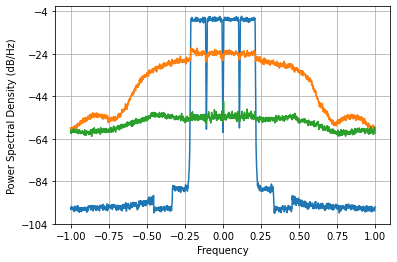

Loss =  2.7682071828874504e-06 Accuracy =  -40.6234143547811 dbs


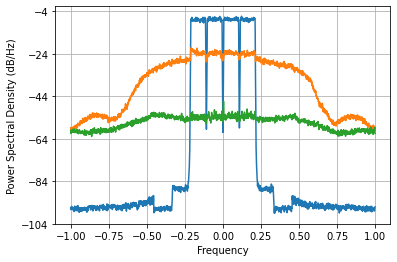

Loss =  2.7680645721933925e-06 Accuracy =  -40.62363809754606 dbs


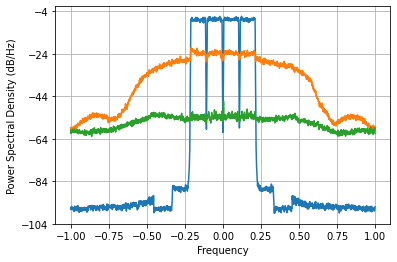

Loss =  2.7678258849862215e-06 Accuracy =  -40.62401260111632 dbs


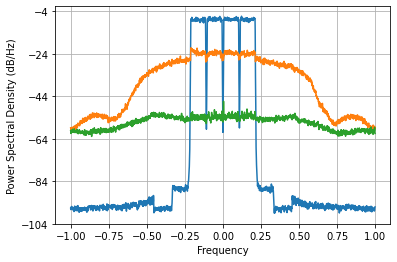

Loss =  2.7643514258902664e-06 Accuracy =  -40.629467735782384 dbs


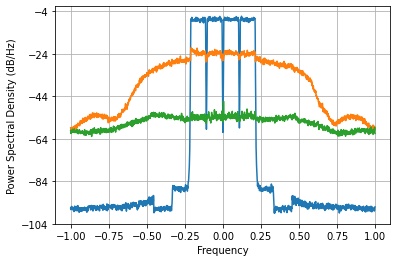

Loss =  2.763854098228309e-06 Accuracy =  -40.630249134588645 dbs


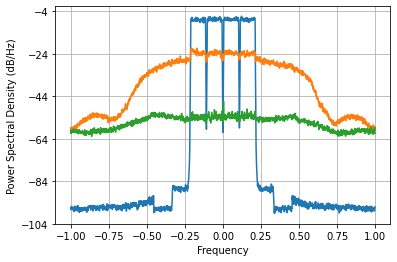

Loss =  2.7632157794812424e-06 Accuracy =  -40.631252263975156 dbs


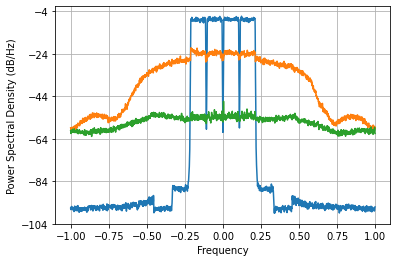

Loss =  2.762947777532891e-06 Accuracy =  -40.63167350292764 dbs


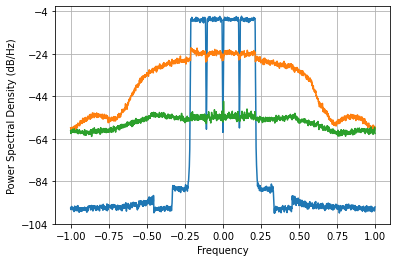

Loss =  2.7626049264851024e-06 Accuracy =  -40.63221244745079 dbs


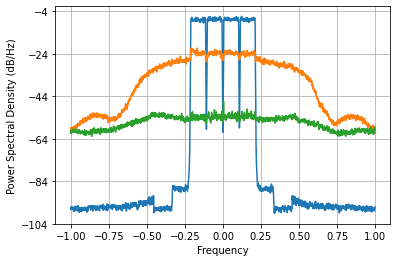

Loss =  2.7594625952005727e-06 Accuracy =  -40.63715515153446 dbs


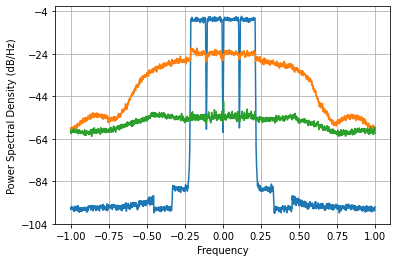

Loss =  2.759022742102184e-06 Accuracy =  -40.637847463870926 dbs


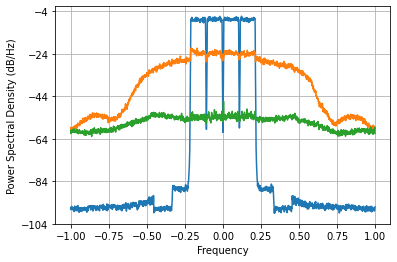

Loss =  2.7582269225419628e-06 Accuracy =  -40.63910033465619 dbs


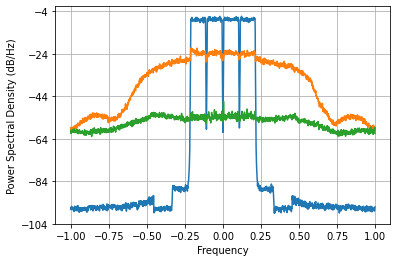

Loss =  2.7578655458963876e-06 Accuracy =  -40.63966937473006 dbs


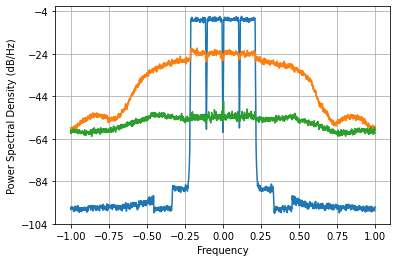

Loss =  2.7574194450065185e-06 Accuracy =  -40.64037192829016 dbs


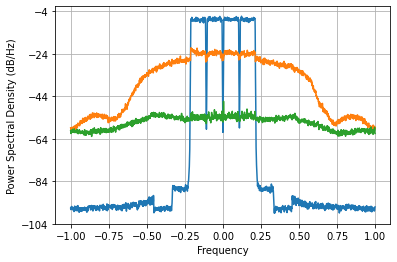

Loss =  2.7545976584118855e-06 Accuracy =  -40.64481852717119 dbs


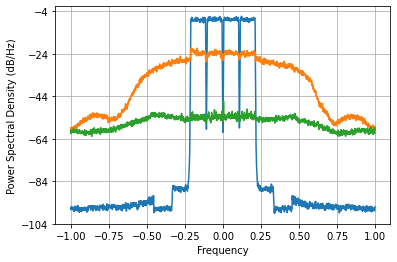

Loss =  2.754279304335201e-06 Accuracy =  -40.64532047854853 dbs


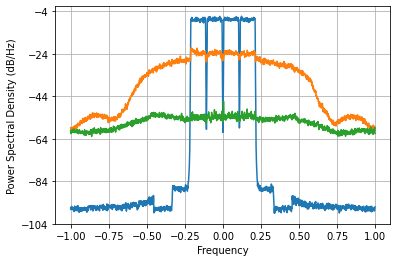

Loss =  2.7533357714301325e-06 Accuracy =  -40.64680849516746 dbs


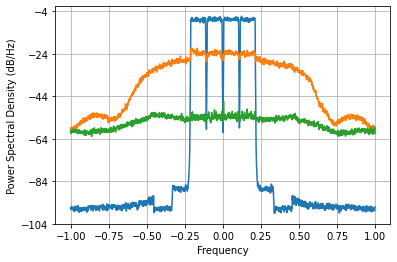

Loss =  2.7528981841186783e-06 Accuracy =  -40.64749877370139 dbs


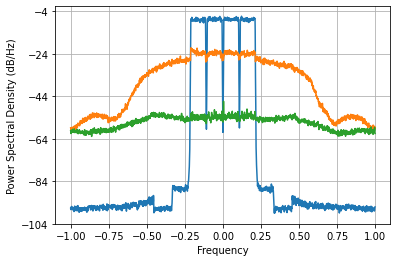

Loss =  2.7523564994038225e-06 Accuracy =  -40.64835341421079 dbs


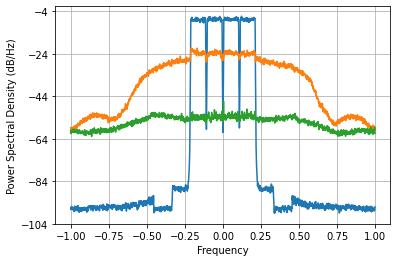

Loss =  2.749870776737369e-06 Accuracy =  -40.652277409556106 dbs


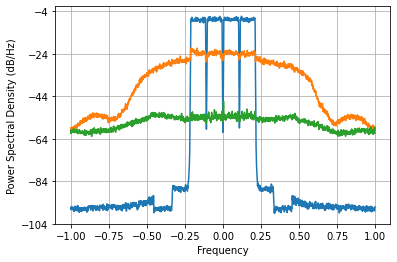

Loss =  2.749776518917792e-06 Accuracy =  -40.65242627601507 dbs


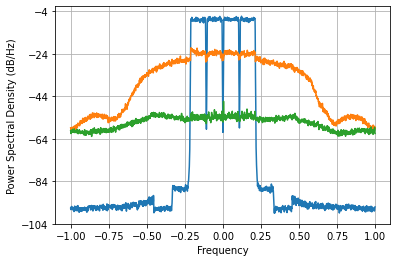

Loss =  2.7487228821129906e-06 Accuracy =  -40.65409068887568 dbs


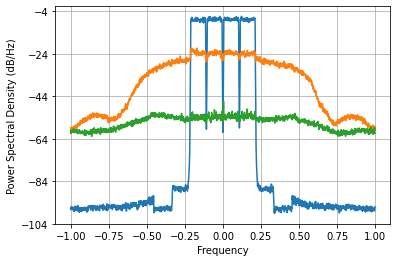

Loss =  2.7482129225288957e-06 Accuracy =  -40.6548964928431 dbs


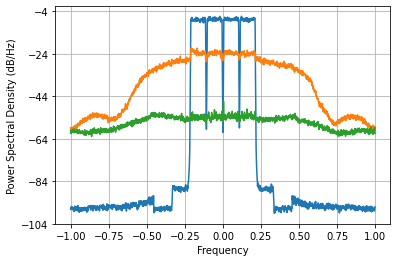

Loss =  2.74759341753128e-06 Accuracy =  -40.655875594312356 dbs


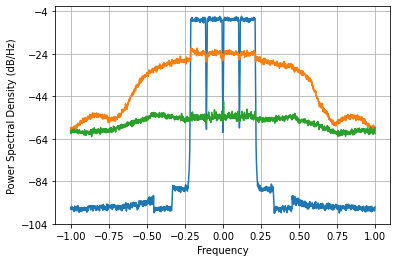

Loss =  2.7454863693295244e-06 Accuracy =  -40.659207348037086 dbs


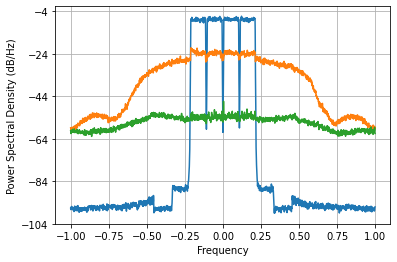

Loss =  2.7457471760332213e-06 Accuracy =  -40.6587948108124 dbs


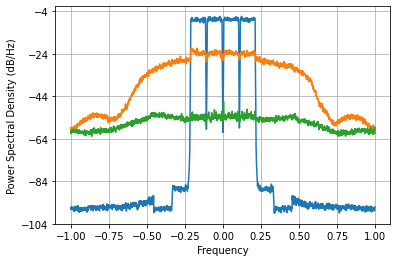

Loss =  2.7446575448975533e-06 Accuracy =  -40.66051862105881 dbs


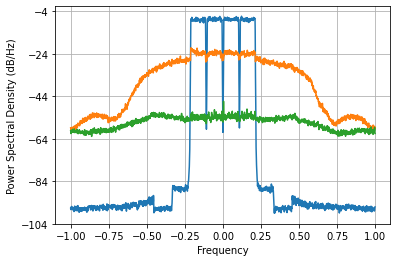

Loss =  2.744071016621139e-06 Accuracy =  -40.66144679956879 dbs


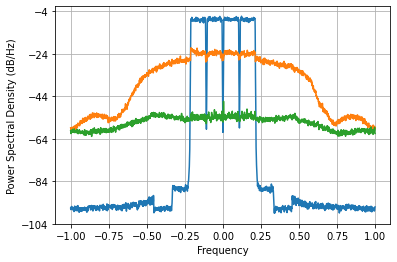

Loss =  2.743395700835261e-06 Accuracy =  -40.66251572968147 dbs


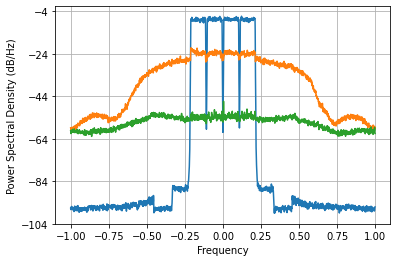

Loss =  2.7417117892084966e-06 Accuracy =  -40.665182271957335 dbs


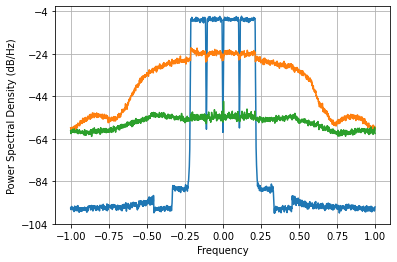

Loss =  2.742464748631695e-06 Accuracy =  -40.66398972783556 dbs


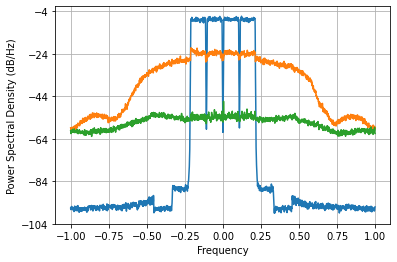

Loss =  2.7414362063710898e-06 Accuracy =  -40.665618824484426 dbs


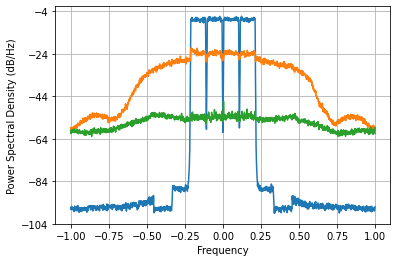

Loss =  2.7407630818406725e-06 Accuracy =  -40.66668530986846 dbs


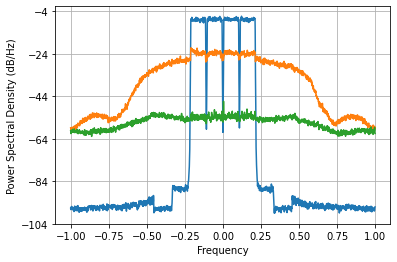

Loss =  2.740046232056996e-06 Accuracy =  -40.667821360730116 dbs


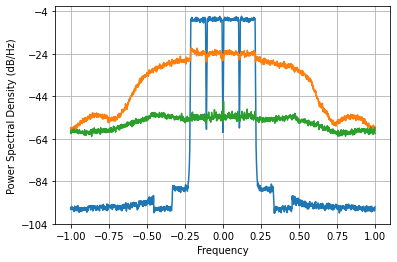

Loss =  2.738772775357089e-06 Accuracy =  -40.66984024555519 dbs


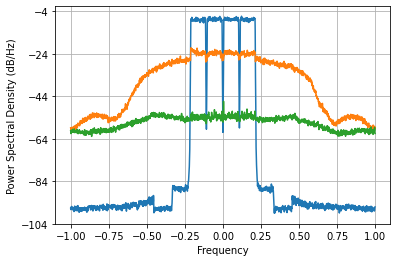

Loss =  2.7401227357901774e-06 Accuracy =  -40.66770010480036 dbs


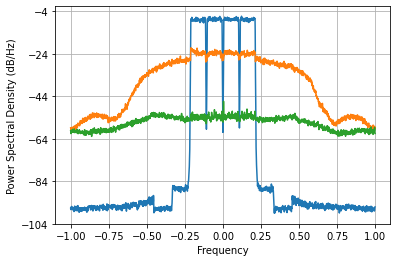

Loss =  2.7392396199537627e-06 Accuracy =  -40.66910002075063 dbs


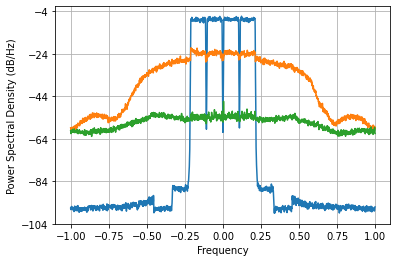

Loss =  2.7384539445425097e-06 Accuracy =  -40.670345853486616 dbs


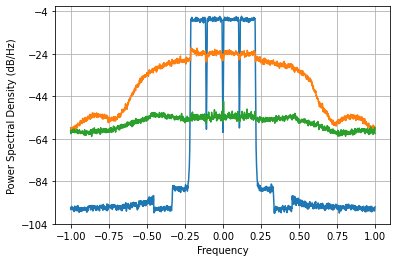

Loss =  2.7376923527464654e-06 Accuracy =  -40.67155383844049 dbs


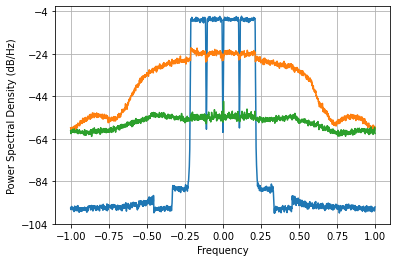

Loss =  2.736701774761783e-06 Accuracy =  -40.67312552855748 dbs


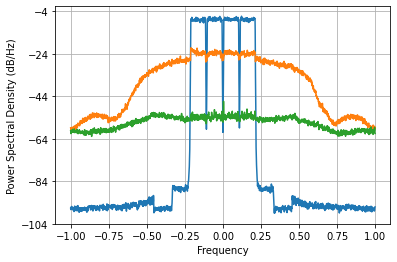

Loss =  2.738692869625544e-06 Accuracy =  -40.669966956047 dbs


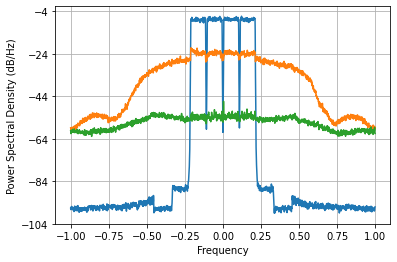

Loss =  2.7380120362534127e-06 Accuracy =  -40.67104673735059 dbs


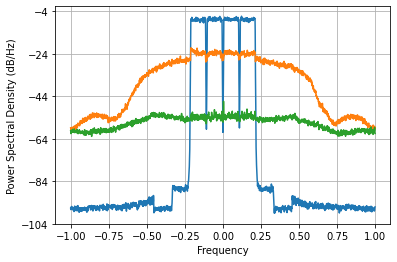

Loss =  2.7370713675126146e-06 Accuracy =  -40.67253905159431 dbs


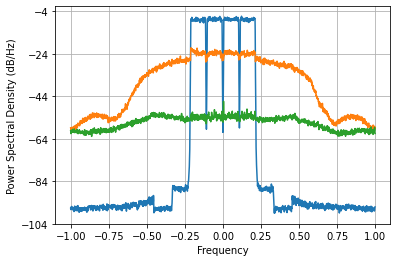

Loss =  2.7362605774550227e-06 Accuracy =  -40.673825732738834 dbs


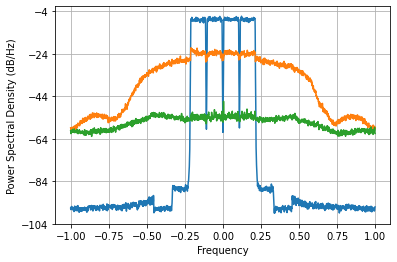

Loss =  2.7353393092081787e-06 Accuracy =  -40.67528819976138 dbs


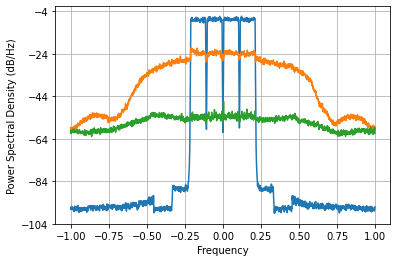

Loss =  2.737997670783993e-06 Accuracy =  -40.671069523446434 dbs


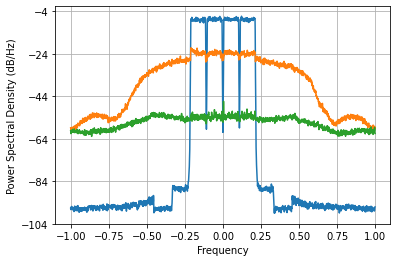

Loss =  2.7376206515293366e-06 Accuracy =  -40.671667583327476 dbs


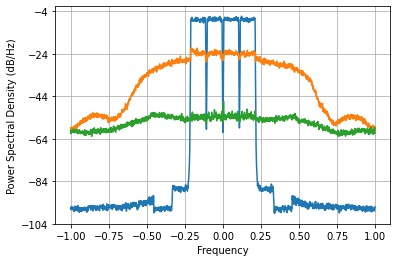

Loss =  2.7365261053320116e-06 Accuracy =  -40.67340431199455 dbs


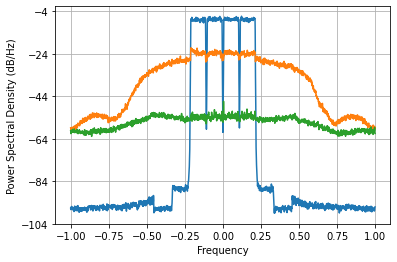

Loss =  2.735720901768281e-06 Accuracy =  -40.674682381009376 dbs


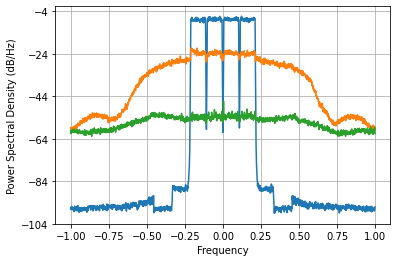

Loss =  2.734670991752809e-06 Accuracy =  -40.6763494284191 dbs


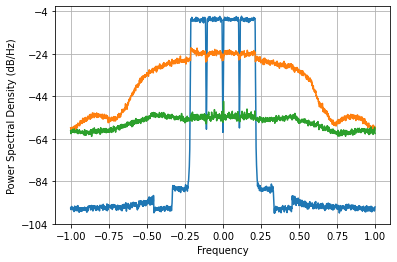

Loss =  2.7380753794272983e-06 Accuracy =  -40.67094626564955 dbs


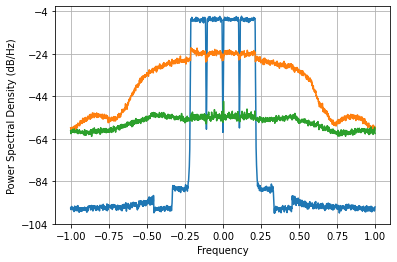

Loss =  2.7382414894846726e-06 Accuracy =  -40.67068280141599 dbs


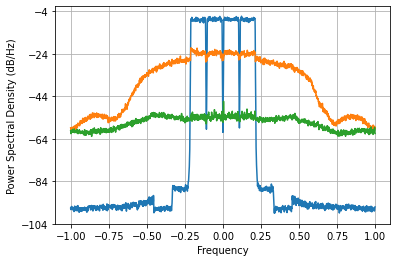

Loss =  2.737101117106607e-06 Accuracy =  -40.67249184780397 dbs


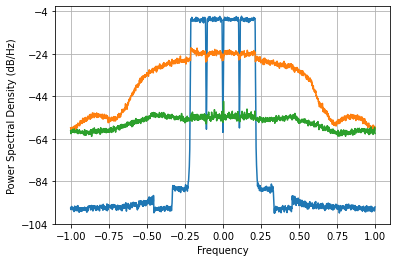

Loss =  2.7364227779734913e-06 Accuracy =  -40.67356829854951 dbs


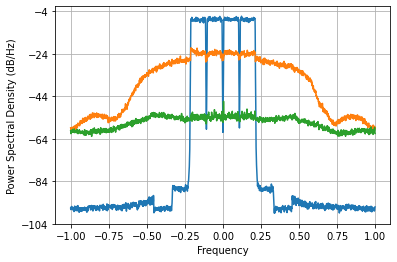

Loss =  2.734935940502901e-06 Accuracy =  -40.675928682352094 dbs


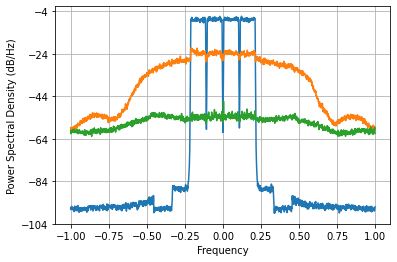

Loss =  2.73901995835045e-06 Accuracy =  -40.66944829859652 dbs


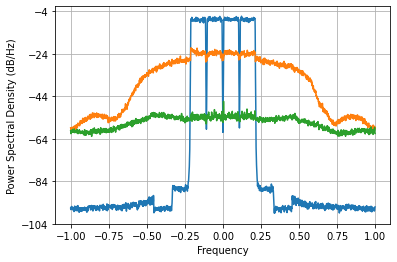

Loss =  2.739915223508076e-06 Accuracy =  -40.668029012883686 dbs


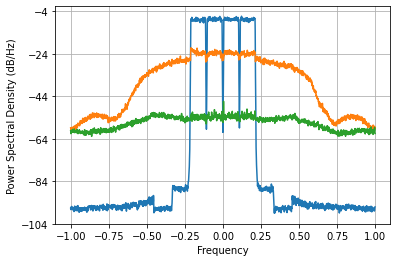

Loss =  2.73874932244153e-06 Accuracy =  -40.66987743562628 dbs


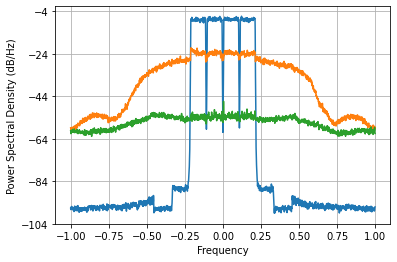

Loss =  2.7380914838300917e-06 Accuracy =  -40.67092072204052 dbs


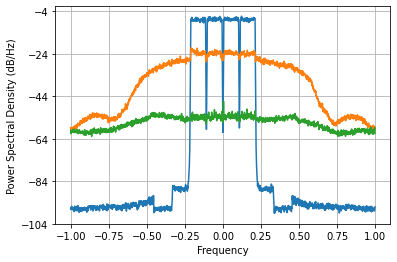

Loss =  2.735182930200957e-06 Accuracy =  -40.675536492472645 dbs


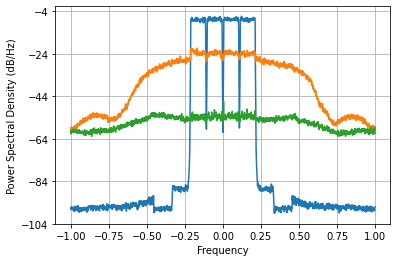

Loss =  2.739161465883816e-06 Accuracy =  -40.669223932383936 dbs


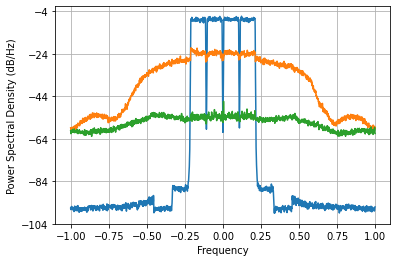

Loss =  2.740418763959449e-06 Accuracy =  -40.66723094166919 dbs


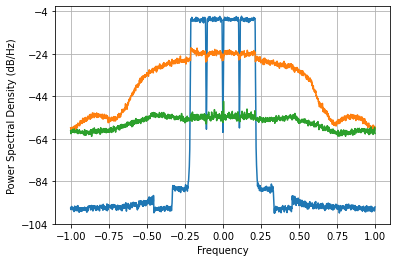

Loss =  2.7388212553026487e-06 Accuracy =  -40.669763370296735 dbs


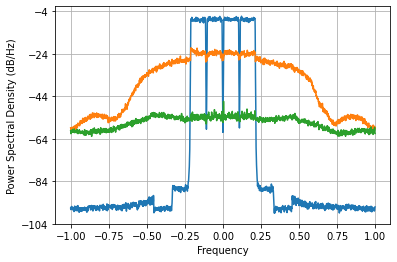

Loss =  2.7375296581121716e-06 Accuracy =  -40.67181193713233 dbs


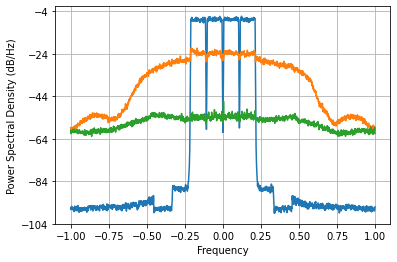

Loss =  2.731817674430129e-06 Accuracy =  -40.680883161704095 dbs


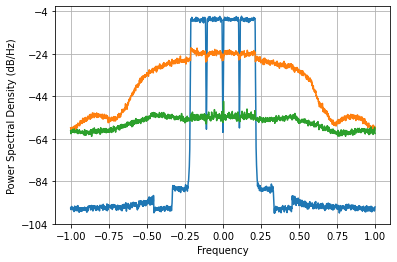

Loss =  2.7347265028139627e-06 Accuracy =  -40.676261271917156 dbs


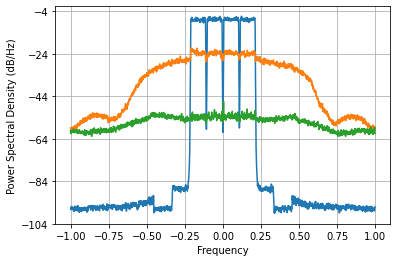

Loss =  2.7362092519989012e-06 Accuracy =  -40.67390719636705 dbs


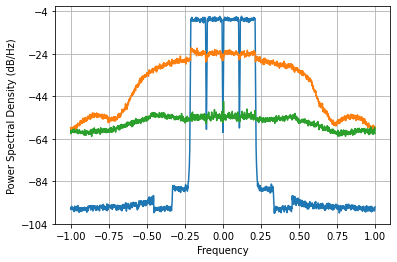

Loss =  2.73453370726816e-06 Accuracy =  -40.67656745607551 dbs


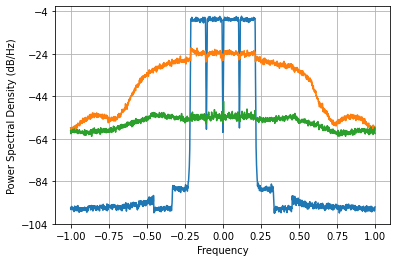

Loss =  2.732817126637685e-06 Accuracy =  -40.67929455935715 dbs


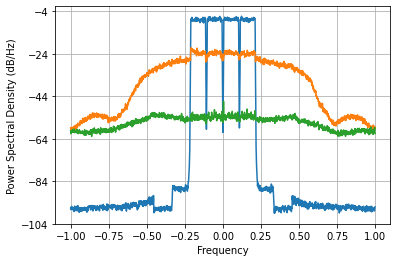

Loss =  2.7250407491724484e-06 Accuracy =  -40.69167025760558 dbs


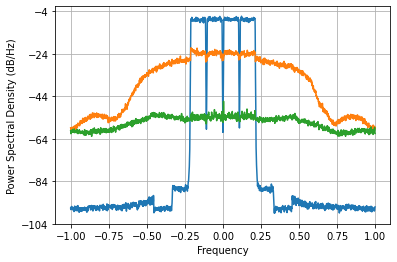

Loss =  2.727630355091317e-06 Accuracy =  -40.68754511738011 dbs


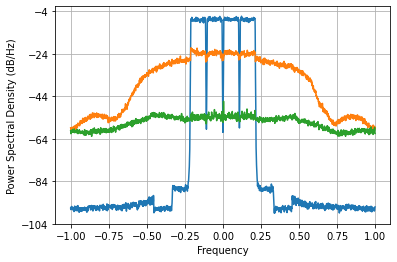

Loss =  2.730385371738411e-06 Accuracy =  -40.683160781794115 dbs


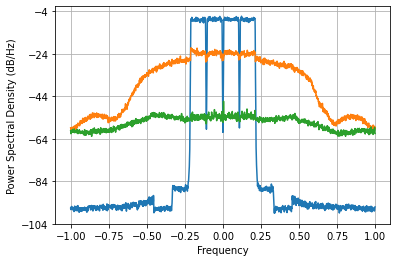

Loss =  2.7300222415117098e-06 Accuracy =  -40.6837384143266 dbs


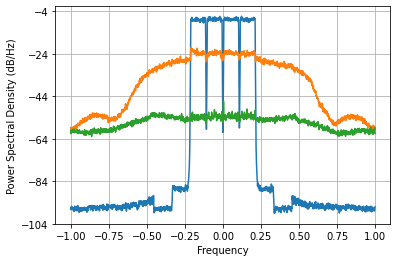

Loss =  2.7287458152071644e-06 Accuracy =  -40.685769440026775 dbs


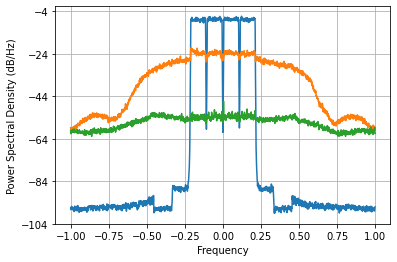

Loss =  2.719572543384352e-06 Accuracy =  -40.70039378770976 dbs


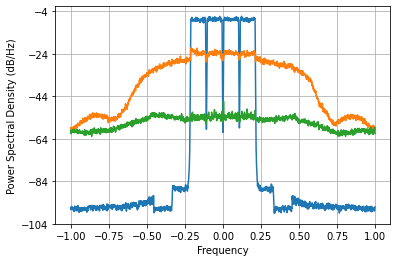

Loss =  2.7215256402906724e-06 Accuracy =  -40.69727596400273 dbs


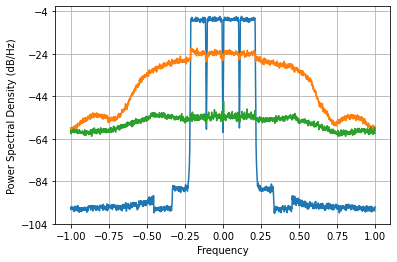

Loss =  2.7248392394196446e-06 Accuracy =  -40.691991419076714 dbs


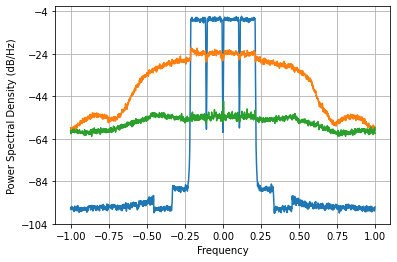

Loss =  2.725664028971406e-06 Accuracy =  -40.690677039335405 dbs


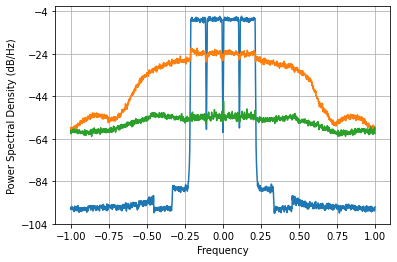

Loss =  2.7248785064661063e-06 Accuracy =  -40.69192883432501 dbs


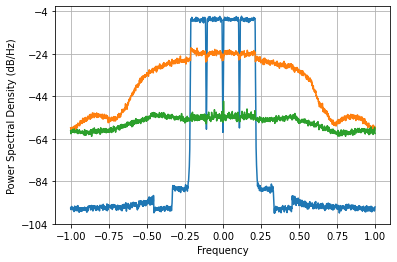

Loss =  2.714687649358783e-06 Accuracy =  -40.70820159600805 dbs


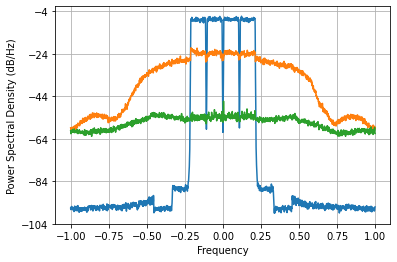

Loss =  2.715757695646583e-06 Accuracy =  -40.70649007816867 dbs


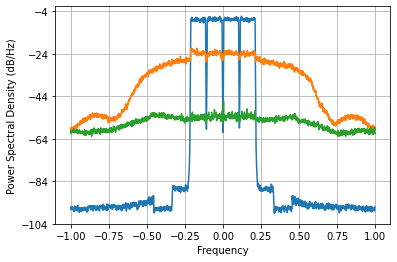

Loss =  2.718957799542429e-06 Accuracy =  -40.70137559655382 dbs


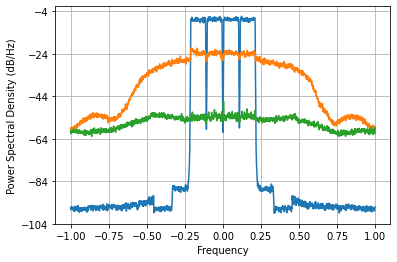

Loss =  2.7208233237256458e-06 Accuracy =  -40.69839684843131 dbs


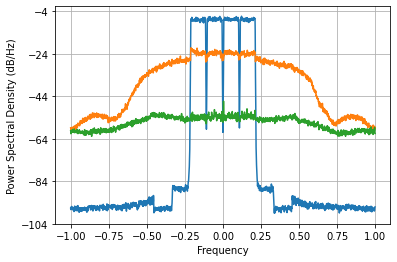

Loss =  2.721202923159607e-06 Accuracy =  -40.69779097873392 dbs


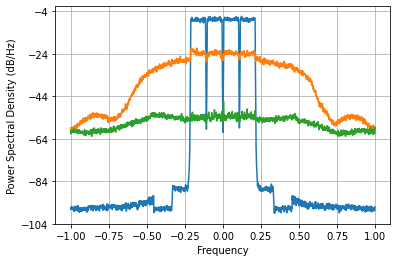

Loss =  2.7109471513692e-06 Accuracy =  -40.71418975390468 dbs


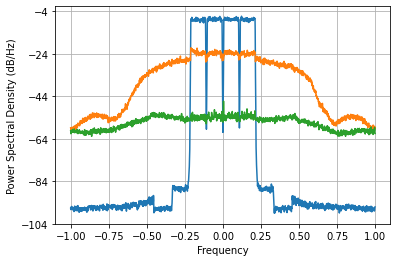

Loss =  2.7107695901223056e-06 Accuracy =  -40.71447421682826 dbs


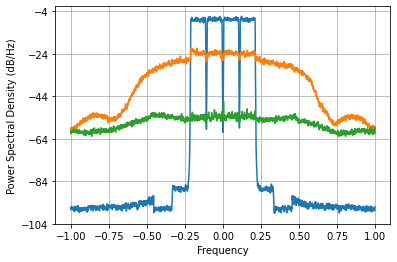

Loss =  2.712462992035107e-06 Accuracy =  -40.71176205164214 dbs


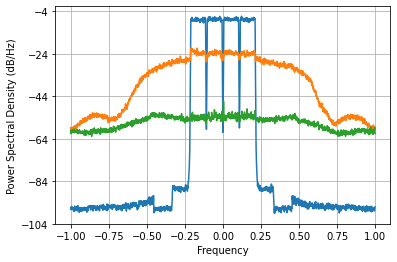

Loss =  2.71363291389989e-06 Accuracy =  -40.70988928482484 dbs


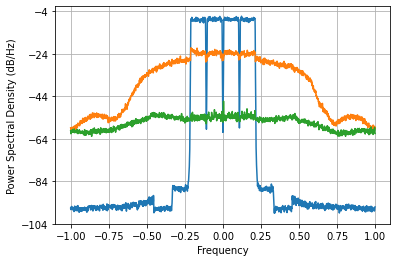

Loss =  2.713998998608928e-06 Accuracy =  -40.709303436072204 dbs


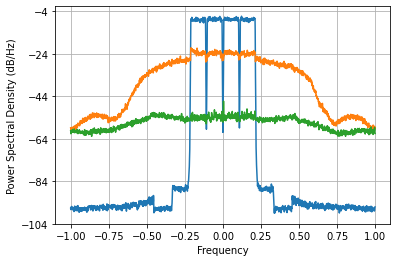

Loss =  2.703329125180922e-06 Accuracy =  -40.726411032431514 dbs


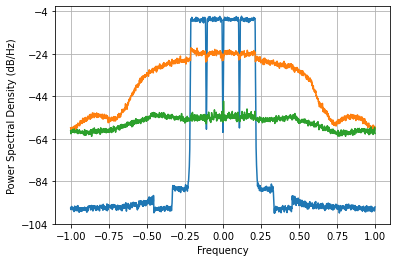

Loss =  2.701234527743822e-06 Accuracy =  -40.72977734361851 dbs


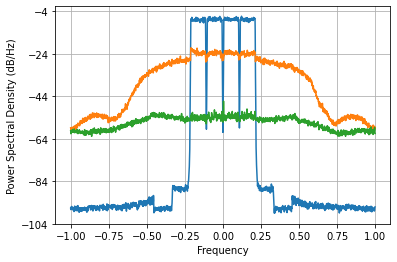

Loss =  2.70061265928942e-06 Accuracy =  -40.73077727579008 dbs


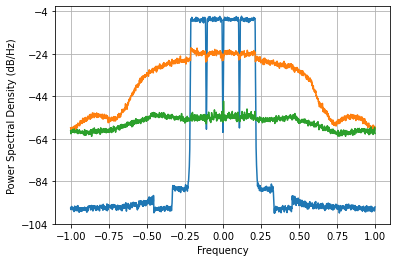

Loss =  2.6999700839778042e-06 Accuracy =  -40.73181074542336 dbs


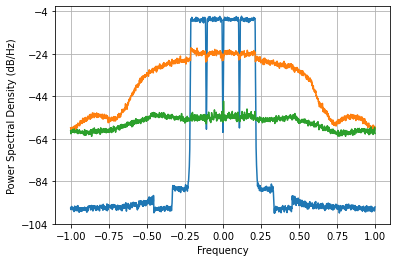

Loss =  2.6992058862835276e-06 Accuracy =  -40.73304014356023 dbs


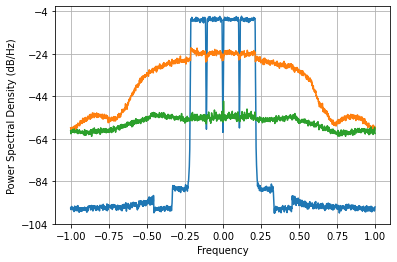

Loss =  2.698128563683459e-06 Accuracy =  -40.734773870721256 dbs


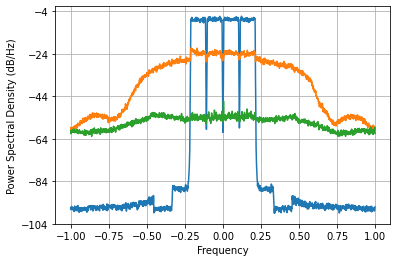

Loss =  2.703772927719524e-06 Accuracy =  -40.72569811452422 dbs


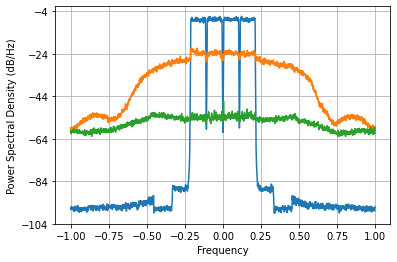

Loss =  2.71049693102978e-06 Accuracy =  -40.71491106802885 dbs


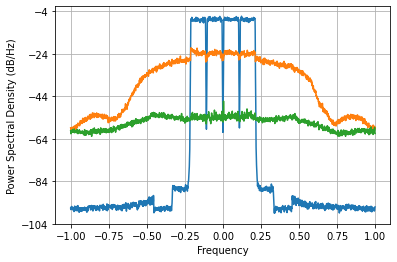

Loss =  2.717562807496768e-06 Accuracy =  -40.70360436530066 dbs


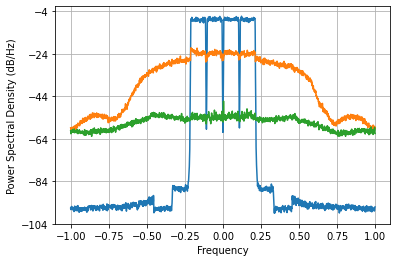

Loss =  2.725130934803931e-06 Accuracy =  -40.69152652957507 dbs


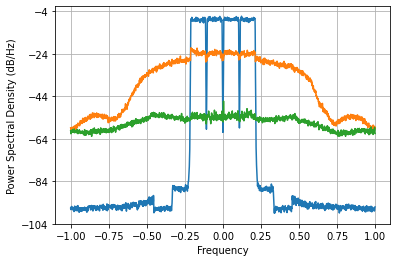

Loss =  2.760228694931038e-06 Accuracy =  -40.635949602636245 dbs


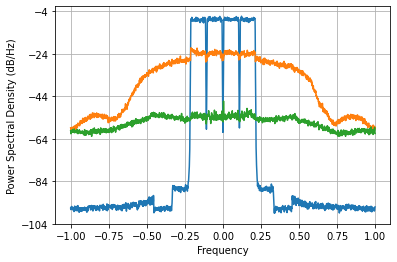

Loss =  2.7949329151686678e-06 Accuracy =  -40.581686384091604 dbs


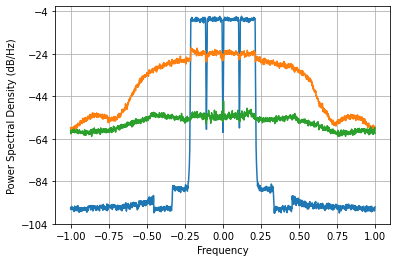

Loss =  2.8256016937241456e-06 Accuracy =  -40.5342908446558 dbs


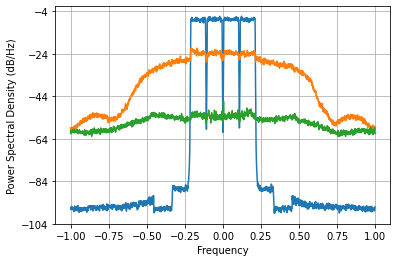

Loss =  2.8518201514088525e-06 Accuracy =  -40.49417893206008 dbs


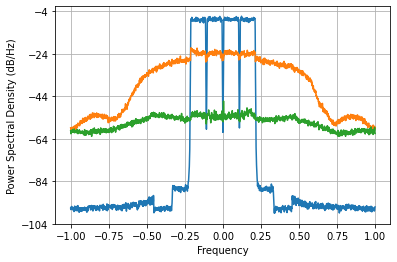

Loss =  2.873535957524724e-06 Accuracy =  -40.461233907111705 dbs


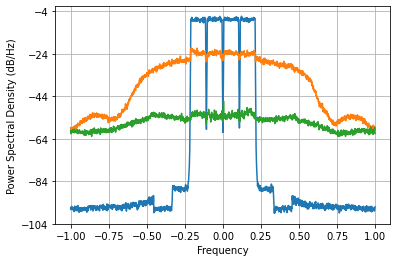

Loss =  2.924239004025827e-06 Accuracy =  -40.38527161176819 dbs


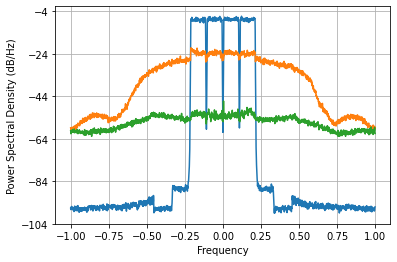

Loss =  2.952232811475508e-06 Accuracy =  -40.3438942395988 dbs


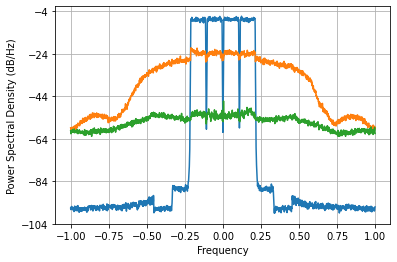

Loss =  2.9617884496244637e-06 Accuracy =  -40.32985991558355 dbs


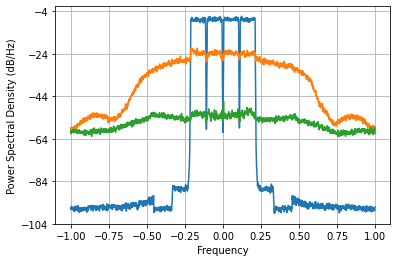

Loss =  2.958480430953337e-06 Accuracy =  -40.33471325732663 dbs


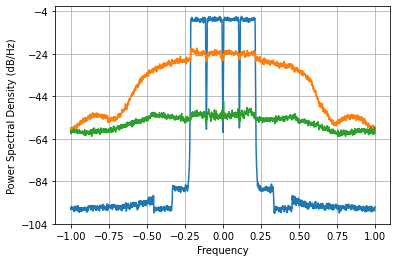

Loss =  2.947325697625467e-06 Accuracy =  -40.35111895973788 dbs


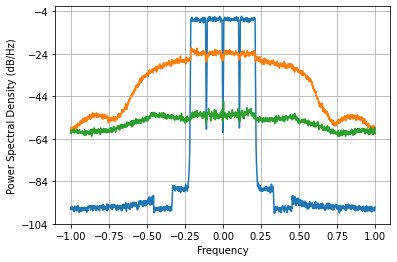

Loss =  2.944029699864221e-06 Accuracy =  -40.355978397652734 dbs


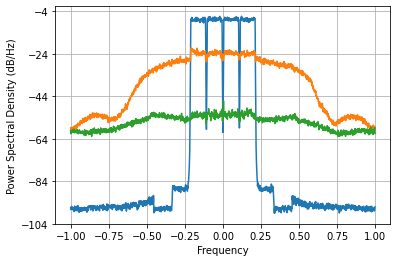

Loss =  2.93518287028766e-06 Accuracy =  -40.36904862473341 dbs


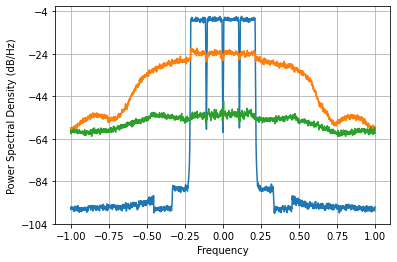

Loss =  2.931105807410353e-06 Accuracy =  -40.37508530752335 dbs


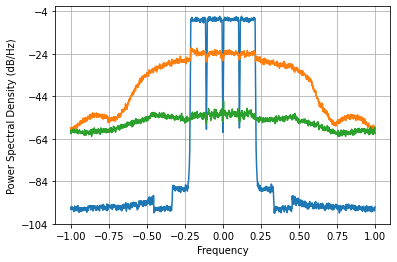

Loss =  2.9341948641410126e-06 Accuracy =  -40.3705107409612 dbs


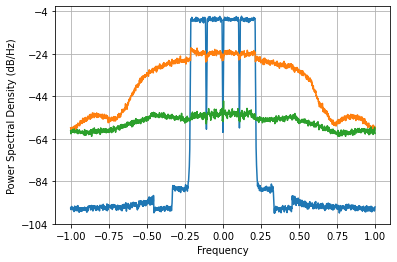

Loss =  2.942542561776387e-06 Accuracy =  -40.35817273367854 dbs


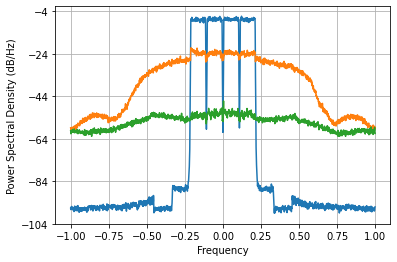

Loss =  2.9689432151102644e-06 Accuracy =  -40.31938135458006 dbs


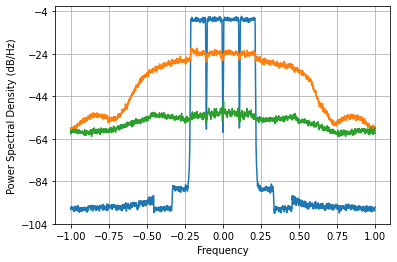

Loss =  2.9859375623748084e-06 Accuracy =  -40.29459304544905 dbs


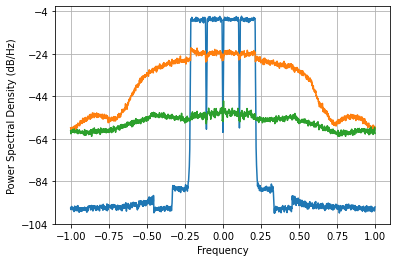

Loss =  2.996793729626487e-06 Accuracy =  -40.27883175356841 dbs


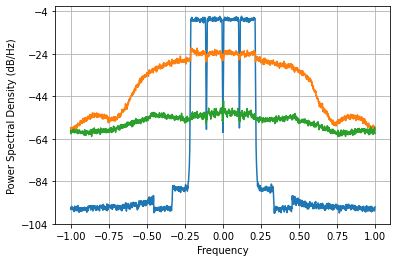

Loss =  3.0029935909444796e-06 Accuracy =  -40.269856213691796 dbs


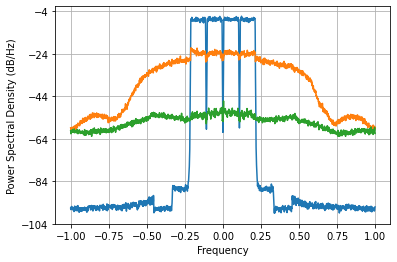

Loss =  3.0053004564060106e-06 Accuracy =  -40.26652129372359 dbs


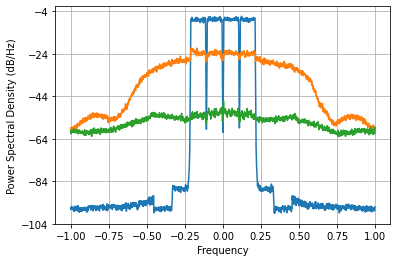

Loss =  2.9975140175385122e-06 Accuracy =  -40.277788039831066 dbs


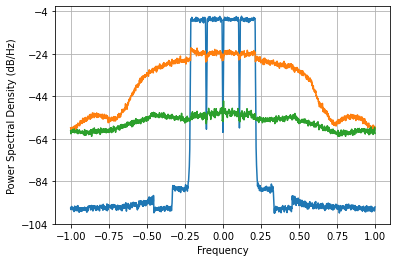

Loss =  2.9807763812014076e-06 Accuracy =  -40.302106303446486 dbs


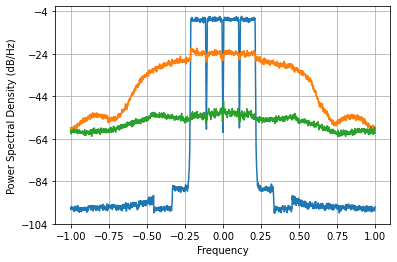

Loss =  2.9657184158933146e-06 Accuracy =  -40.32410112709647 dbs


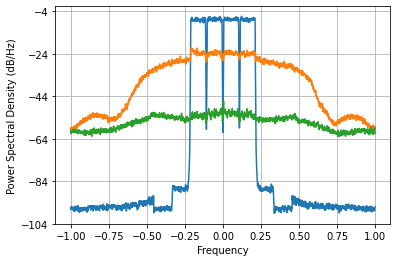

Loss =  2.9549321724108437e-06 Accuracy =  -40.33992510163269 dbs


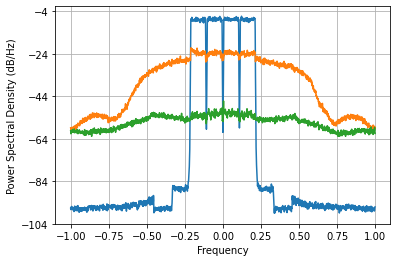

Loss =  2.9475975706307882e-06 Accuracy =  -40.35071836776848 dbs


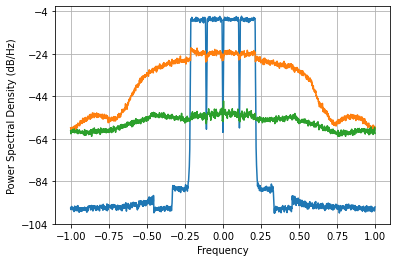

Loss =  2.9223971502188007e-06 Accuracy =  -40.38800790987268 dbs


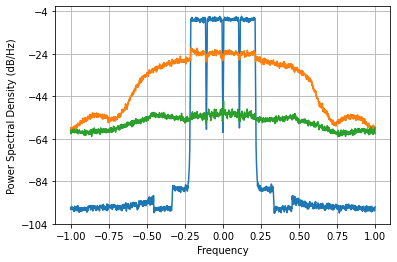

Loss =  2.900353718662421e-06 Accuracy =  -40.42089060273607 dbs


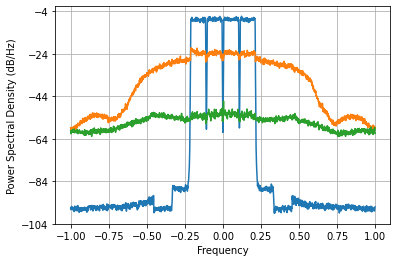

Loss =  2.887824908986216e-06 Accuracy =  -40.43969168596134 dbs


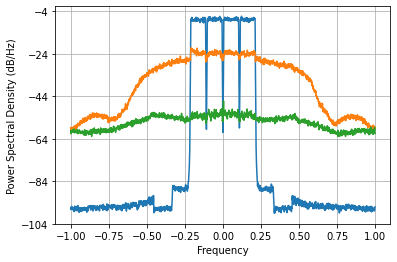

Loss =  2.88281439510523e-06 Accuracy =  -40.44723344680337 dbs


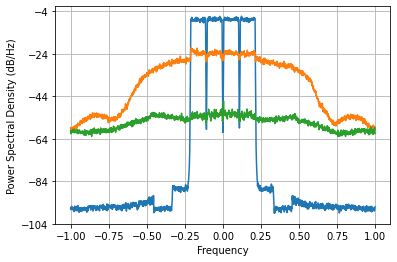

Loss =  2.8815713562948834e-06 Accuracy =  -40.44910648211979 dbs


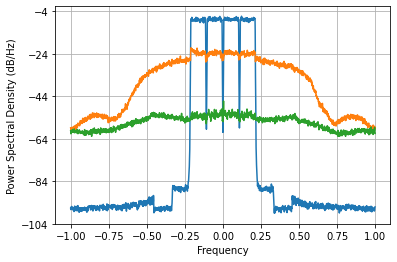

Loss =  2.860784552252822e-06 Accuracy =  -40.48054874681986 dbs


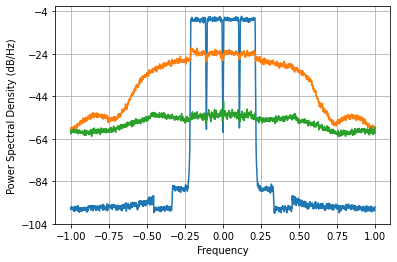

Loss =  2.8444414657271945e-06 Accuracy =  -40.505430256114245 dbs


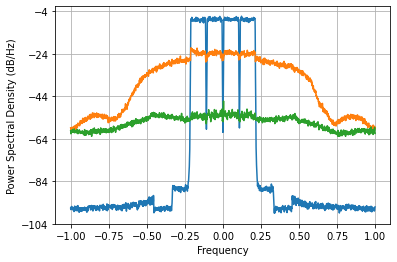

Loss =  2.8376737115070475e-06 Accuracy =  -40.51577569829867 dbs


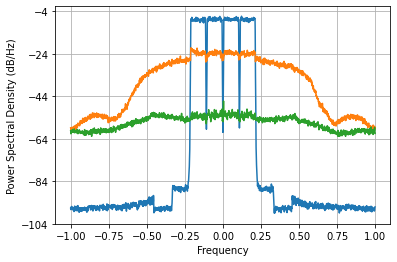

Loss =  2.837227165855373e-06 Accuracy =  -40.516459172132066 dbs


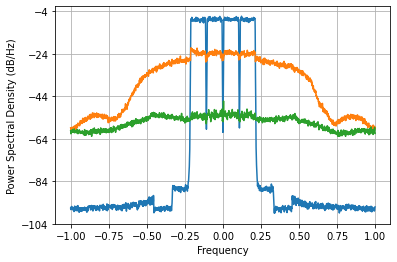

Loss =  2.8389166147943208e-06 Accuracy =  -40.51387390156225 dbs


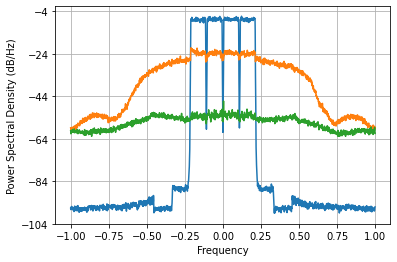

Loss =  2.8210099158442964e-06 Accuracy =  -40.541354139859386 dbs


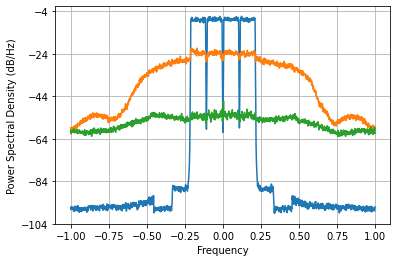

Loss =  2.8078604063929792e-06 Accuracy =  -40.5616451377185 dbs


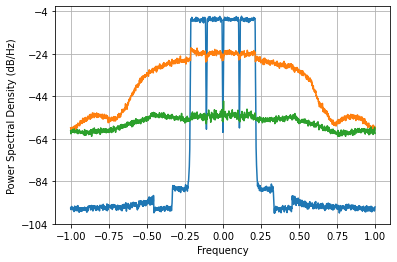

Loss =  2.804097907552309e-06 Accuracy =  -40.56746853353896 dbs


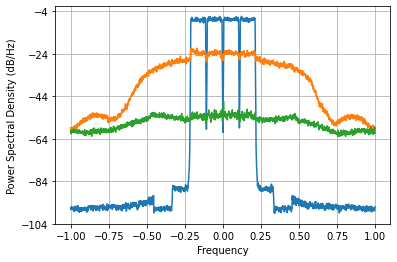

Loss =  2.8056386783673004e-06 Accuracy =  -40.565082866157226 dbs


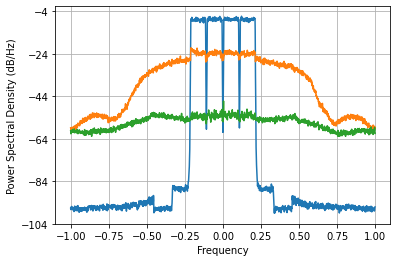

Loss =  2.808129706752252e-06 Accuracy =  -40.561228628224214 dbs


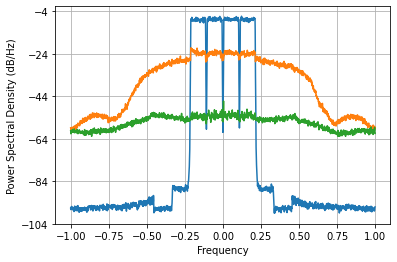

Loss =  2.791845457101618e-06 Accuracy =  -40.586486524883966 dbs


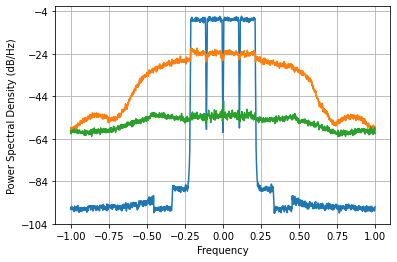

Loss =  2.7808611789059576e-06 Accuracy =  -40.603607173422034 dbs


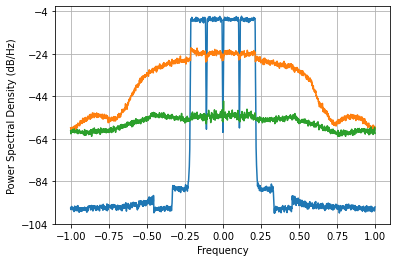

Loss =  2.7790433868676366e-06 Accuracy =  -40.60644699583367 dbs


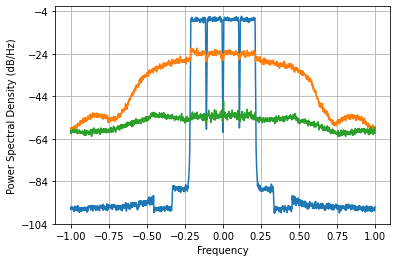

Loss =  2.781509440822552e-06 Accuracy =  -40.6025948835416 dbs


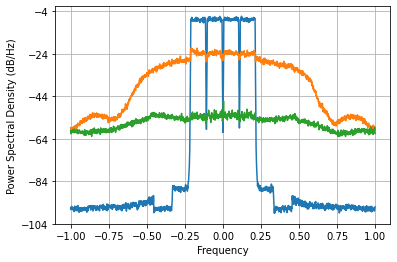

Loss =  2.7839214718294695e-06 Accuracy =  -40.5988304604861 dbs


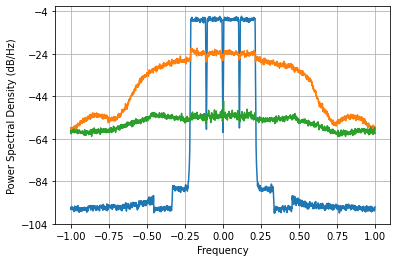

Loss =  2.768820022702082e-06 Accuracy =  -40.622452997933856 dbs


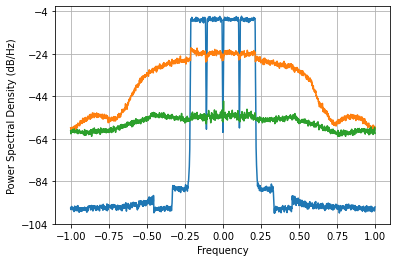

Loss =  2.759645491623279e-06 Accuracy =  -40.63686731188384 dbs


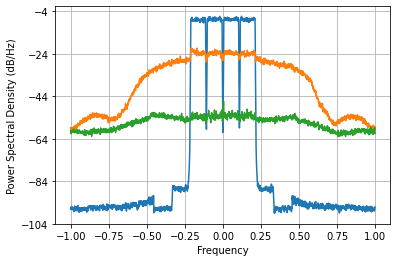

Loss =  2.759300870193562e-06 Accuracy =  -40.637409687821766 dbs


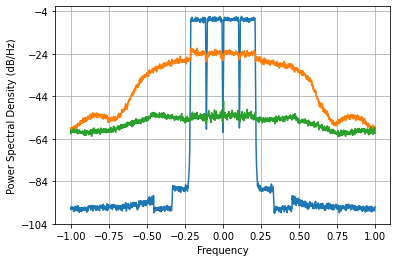

Loss =  2.762184093069755e-06 Accuracy =  -40.63287406775806 dbs


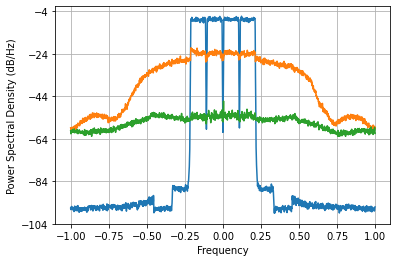

Loss =  2.764176247008275e-06 Accuracy =  -40.62974295995171 dbs


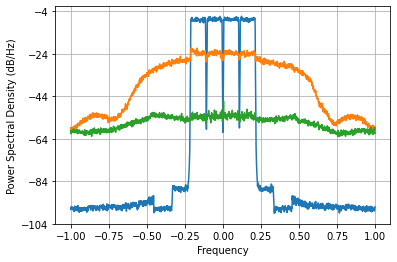

Loss =  2.7502854113239565e-06 Accuracy =  -40.651622615375196 dbs


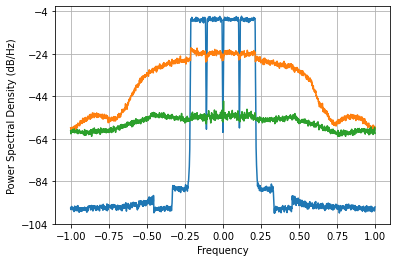

Loss =  2.74287524293467e-06 Accuracy =  -40.663339721049326 dbs


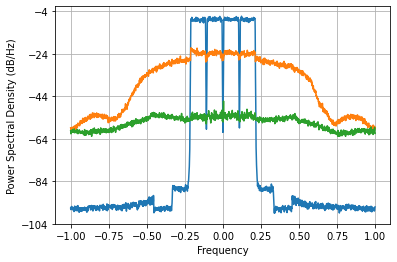

Loss =  2.7437530385042756e-06 Accuracy =  -40.661950081526406 dbs


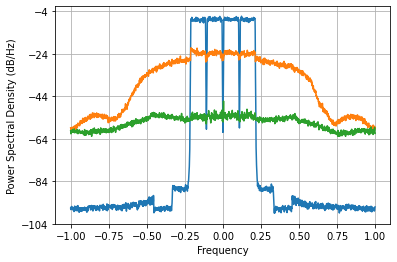

Loss =  2.746747714070527e-06 Accuracy =  -40.6572125493373 dbs


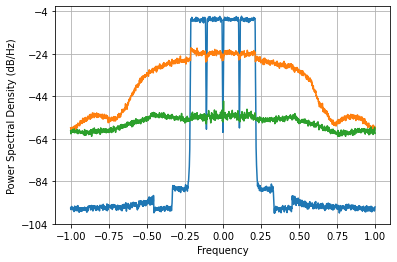

Loss =  2.7481922304857575e-06 Accuracy =  -40.654929192179864 dbs


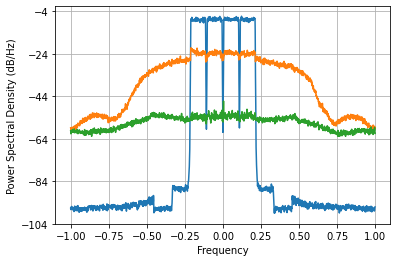

Loss =  2.7355767220475844e-06 Accuracy =  -40.67491127170925 dbs


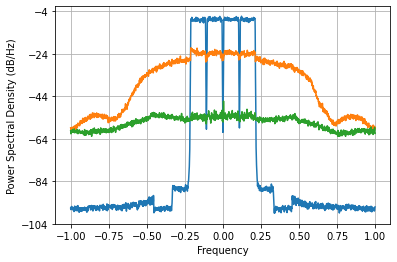

Loss =  2.7298343507752664e-06 Accuracy =  -40.68403732294697 dbs


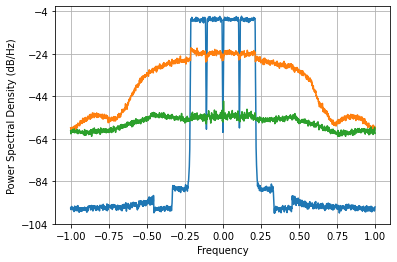

Loss =  2.7316423861462903e-06 Accuracy =  -40.6811618376113 dbs


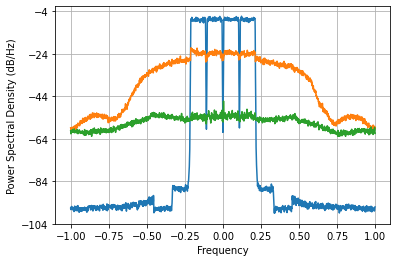

Loss =  2.7344693746244046e-06 Accuracy =  -40.67666962940316 dbs


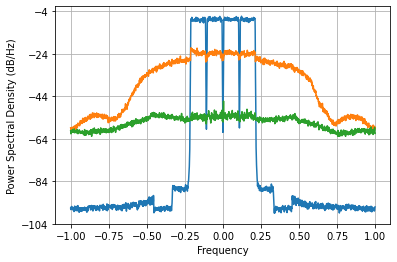

Loss =  2.7353181847423483e-06 Accuracy =  -40.67532173956515 dbs


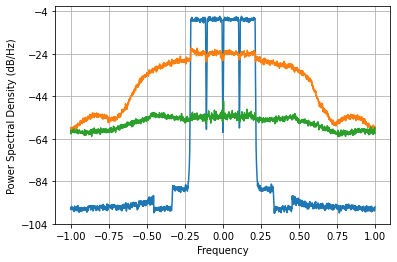

Loss =  2.723964920030872e-06 Accuracy =  -40.69338516375211 dbs


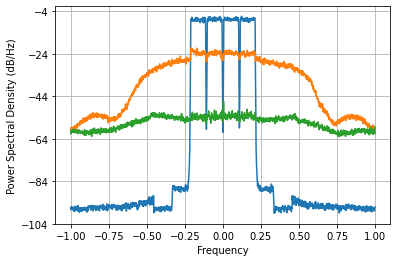

Loss =  2.7197062525772697e-06 Accuracy =  -40.70018026982677 dbs


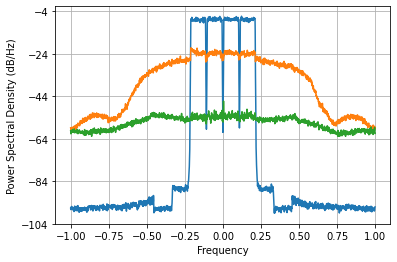

Loss =  2.722133545753257e-06 Accuracy =  -40.69630599148978 dbs


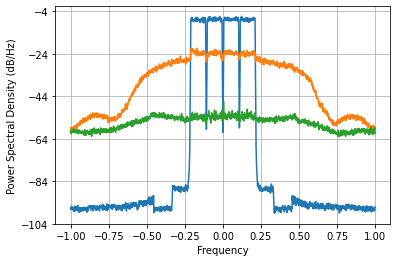

Loss =  2.724583949049235e-06 Accuracy =  -40.69239832892901 dbs


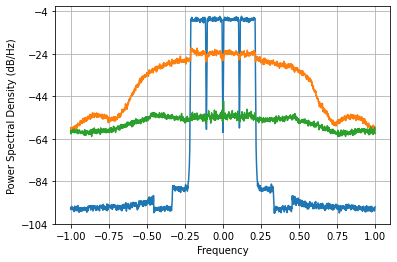

Loss =  2.7248840341752734e-06 Accuracy =  -40.69192002420321 dbs


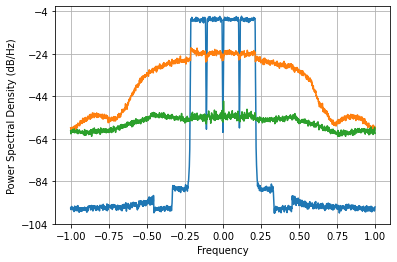

Loss =  2.714769304205844e-06 Accuracy =  -40.708070966923756 dbs


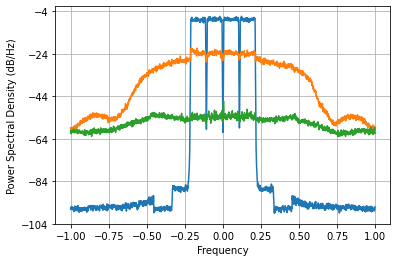

Loss =  2.7117957181214374e-06 Accuracy =  -40.71283056033824 dbs


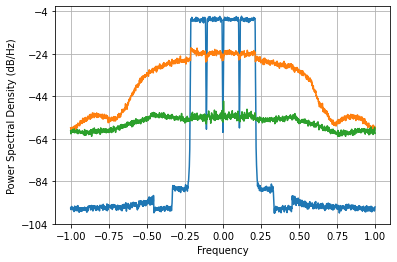

Loss =  2.7145805320578993e-06 Accuracy =  -40.70837296515447 dbs


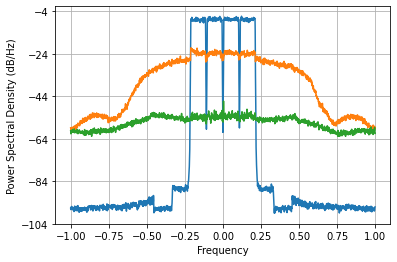

Loss =  2.716555497199867e-06 Accuracy =  -40.705214449159676 dbs


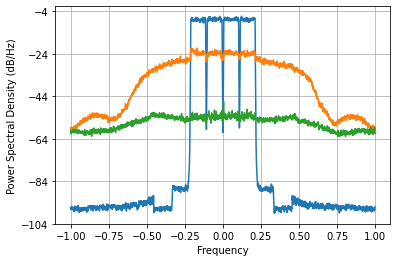

Loss =  2.7164370761707552e-06 Accuracy =  -40.70540377244256 dbs


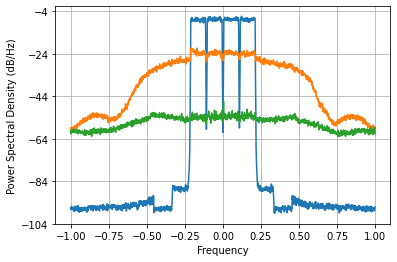

Loss =  2.707532135636093e-06 Accuracy =  -40.71966406729159 dbs


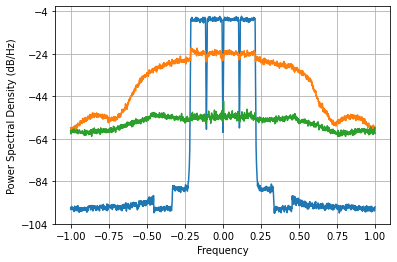

Loss =  2.705649417561244e-06 Accuracy =  -40.72268504154054 dbs


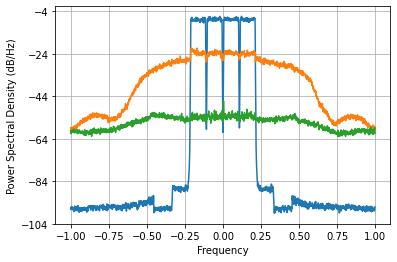

Loss =  2.708593985373912e-06 Accuracy =  -40.7179611693998 dbs


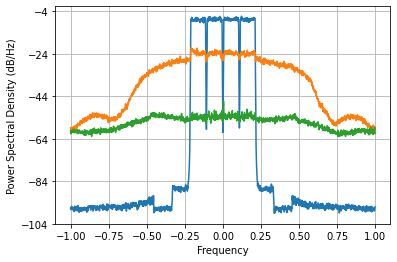

Loss =  2.71009174429453e-06 Accuracy =  -40.715560334645915 dbs


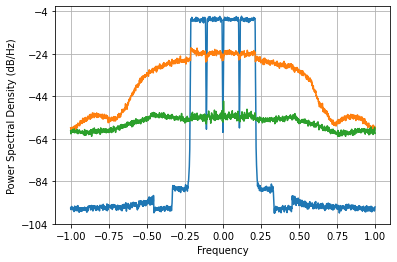

Loss =  2.7097251578092864e-06 Accuracy =  -40.71614783230792 dbs


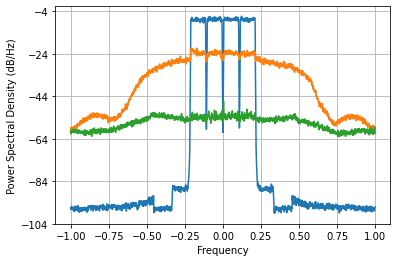

Loss =  2.70196175930422e-06 Accuracy =  -40.728608285013664 dbs


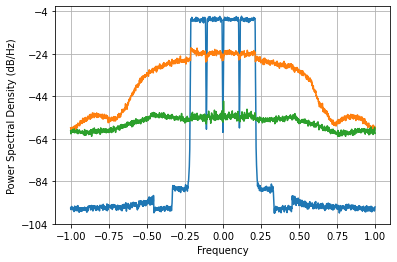

Loss =  2.700972093890504e-06 Accuracy =  -40.73019929554459 dbs


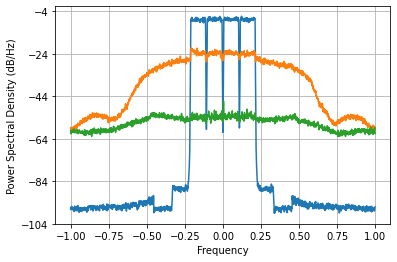

Loss =  2.7039319467008623e-06 Accuracy =  -40.7254426972345 dbs


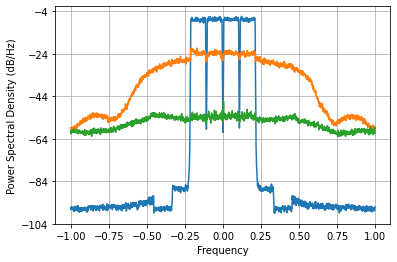

Loss =  2.7050112755075644e-06 Accuracy =  -40.72370946938619 dbs


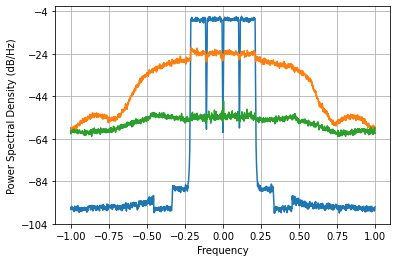

Loss =  2.704564308617276e-06 Accuracy =  -40.724427142155406 dbs


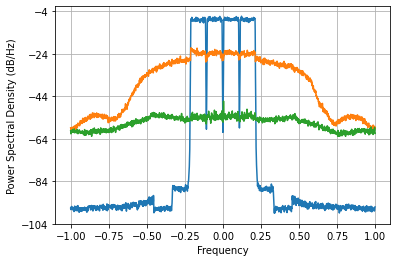

Loss =  2.69779354145724e-06 Accuracy =  -40.735313160583175 dbs


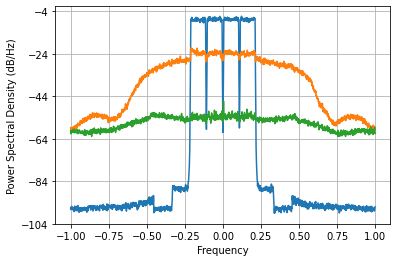

Loss =  2.6974692485054024e-06 Accuracy =  -40.73583524317732 dbs


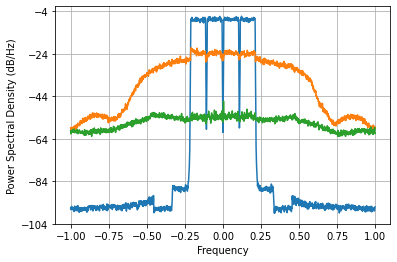

Loss =  2.700315030052027e-06 Accuracy =  -40.731255929617795 dbs


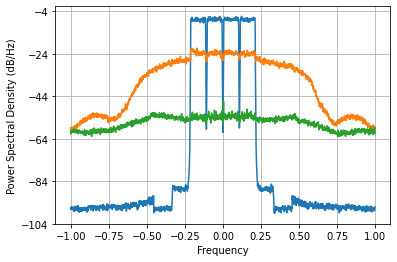

Loss =  2.701034474604353e-06 Accuracy =  -40.73009899355695 dbs


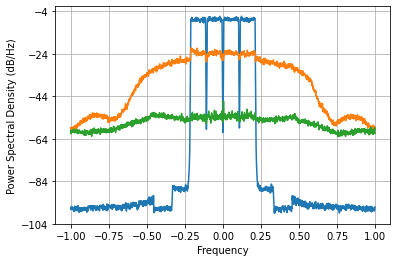

Loss =  2.700622001790192e-06 Accuracy =  -40.73076225183061 dbs


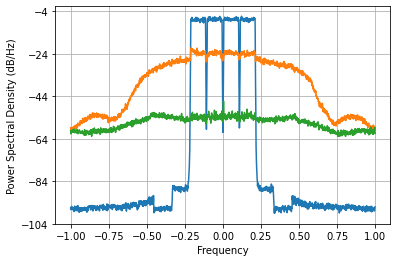

Loss =  2.694563297945081e-06 Accuracy =  -40.74051636631352 dbs


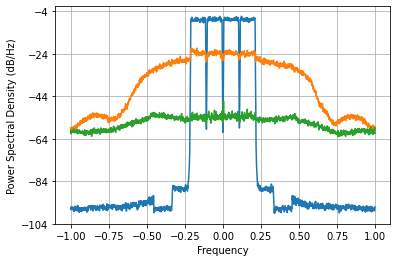

Loss =  2.694596856018941e-06 Accuracy =  -40.740462279643666 dbs


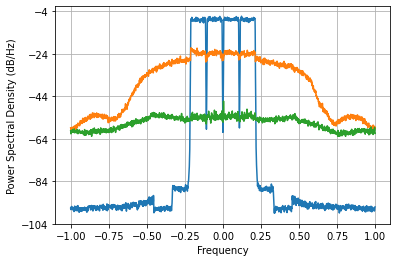

Loss =  2.6971465867983326e-06 Accuracy =  -40.73635476190987 dbs


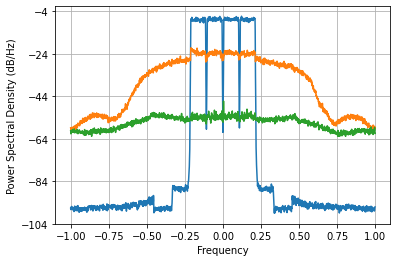

Loss =  2.6974840747709237e-06 Accuracy =  -40.735811372849184 dbs


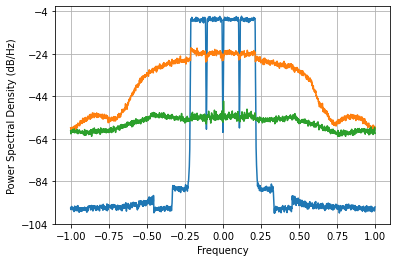

Loss =  2.697101665861872e-06 Accuracy =  -40.73642709419387 dbs


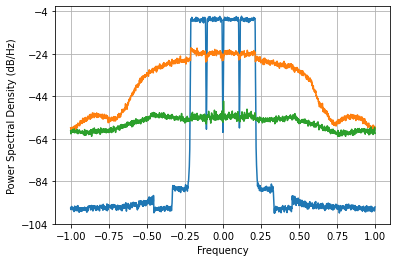

Loss =  2.6913367245061236e-06 Accuracy =  -40.74571989107927 dbs


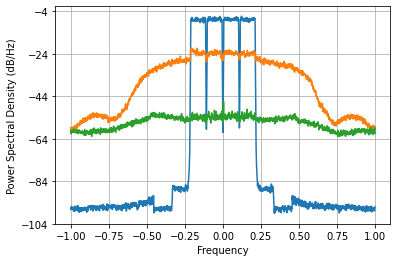

Loss =  2.69133238707305e-06 Accuracy =  -40.7457268902955 dbs


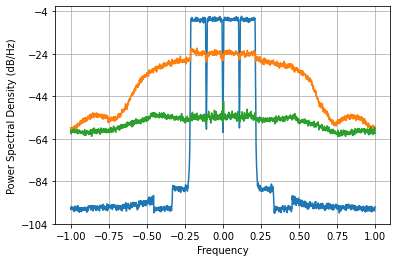

Loss =  2.693333330573594e-06 Accuracy =  -40.74249921078314 dbs


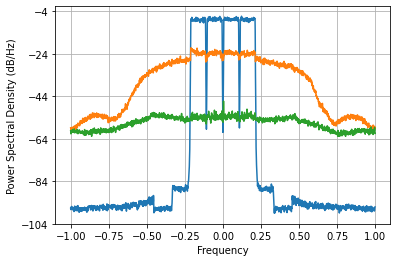

Loss =  2.6931719887108757e-06 Accuracy =  -40.74275937902412 dbs


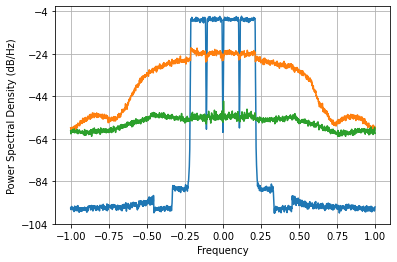

Loss =  2.692697268696014e-06 Accuracy =  -40.74352496865724 dbs


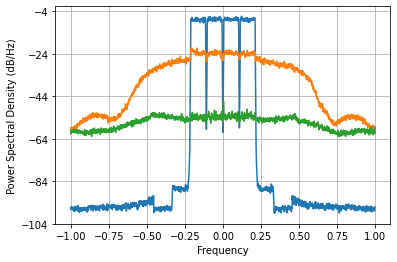

Loss =  2.6868951197482408e-06 Accuracy =  -40.7528931217303 dbs


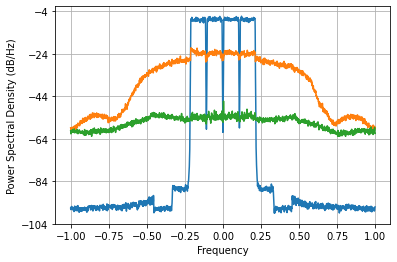

Loss =  2.6865906823327333e-06 Accuracy =  -40.75338522497446 dbs


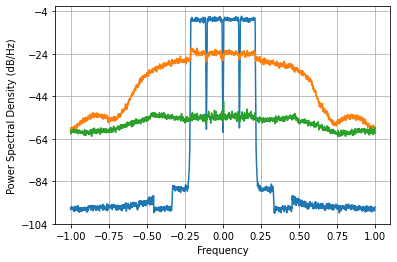

Loss =  2.6879355648285956e-06 Accuracy =  -40.751211730857605 dbs


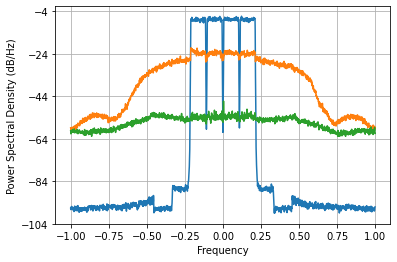

Loss =  2.687286877733156e-06 Accuracy =  -40.75225995250949 dbs


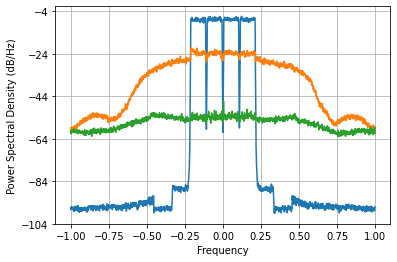

Loss =  2.6867097915846235e-06 Accuracy =  -40.753192685989895 dbs


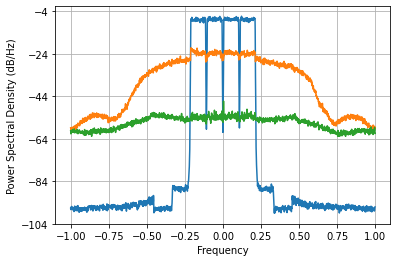

Loss =  2.6810662085809785e-06 Accuracy =  -40.762324877272384 dbs


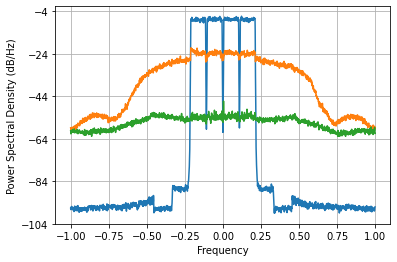

Loss =  2.6806815168986307e-06 Accuracy =  -40.76294806763387 dbs


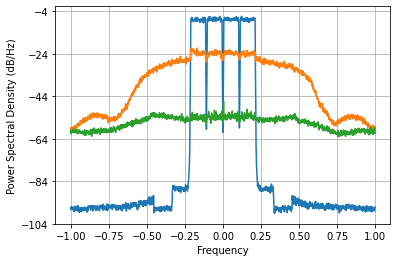

Loss =  2.681665355920255e-06 Accuracy =  -40.76135445247581 dbs


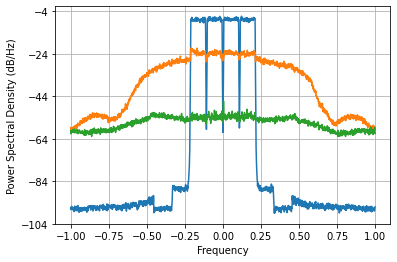

Loss =  2.680854346038348e-06 Accuracy =  -40.7626680779308 dbs


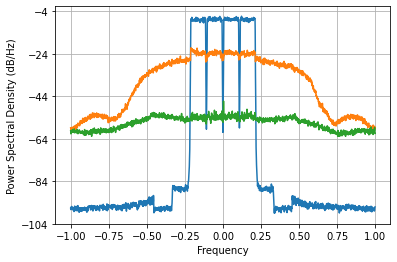

Loss =  2.6804041338401007e-06 Accuracy =  -40.763397476353106 dbs


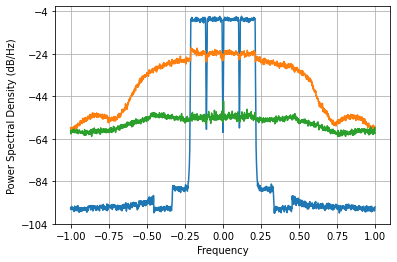

Loss =  2.6754299741055678e-06 Accuracy =  -40.77146438321536 dbs


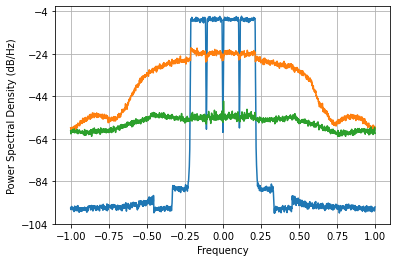

Loss =  2.675343983555652e-06 Accuracy =  -40.77160397132588 dbs


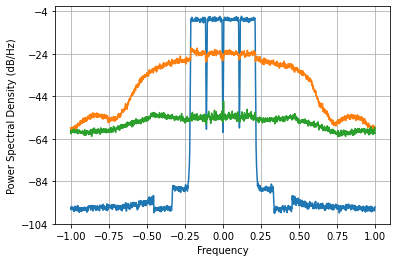

Loss =  2.6762802249015416e-06 Accuracy =  -40.770084415996294 dbs


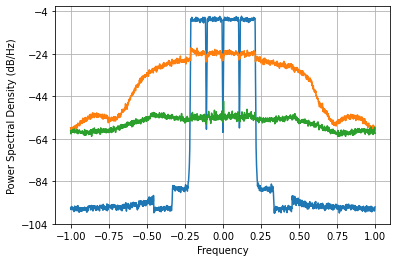

Loss =  2.675553684578921e-06 Accuracy =  -40.771263572376206 dbs


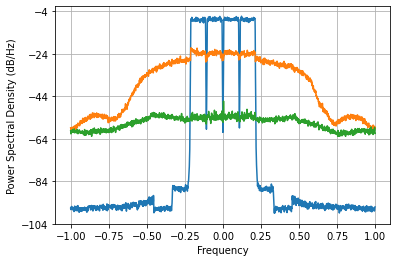

Loss =  2.6753335062612493e-06 Accuracy =  -40.771620979381964 dbs


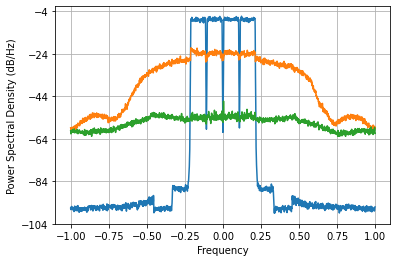

Loss =  2.6711164765985624e-06 Accuracy =  -40.778472004260905 dbs


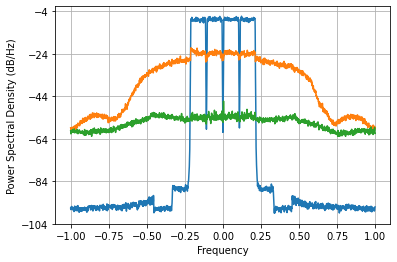

Loss =  2.671340527794437e-06 Accuracy =  -40.778107736666385 dbs


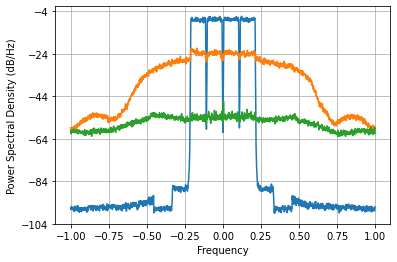

Loss =  2.6722268477834827e-06 Accuracy =  -40.77666703663617 dbs


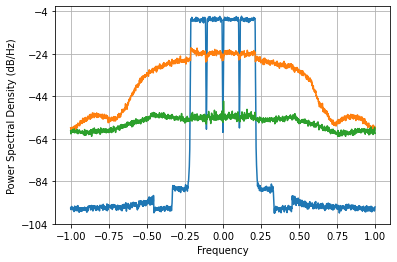

Loss =  2.671578959816224e-06 Accuracy =  -40.7777201219487 dbs


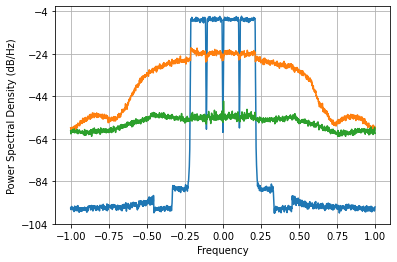

Loss =  2.6715097149486575e-06 Accuracy =  -40.77783268853974 dbs


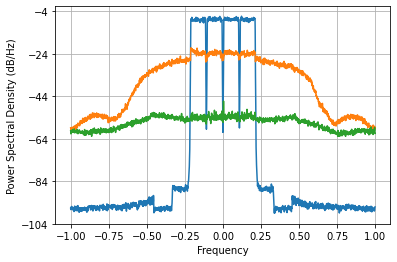

Loss =  2.667850649960055e-06 Accuracy =  -40.783785131805 dbs


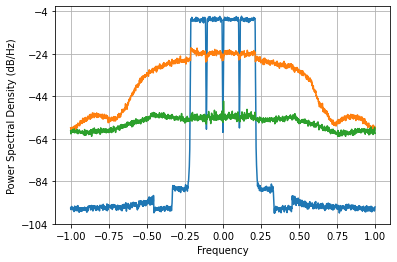

Loss =  2.6682518352155735e-06 Accuracy =  -40.7831320988338 dbs


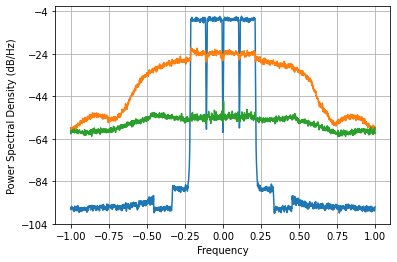

Loss =  2.6690136080261394e-06 Accuracy =  -40.781892386348616 dbs


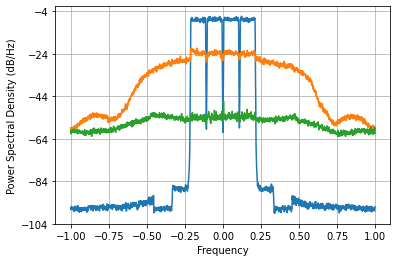

Loss =  2.6684150978870817e-06 Accuracy =  -40.78286637463462 dbs


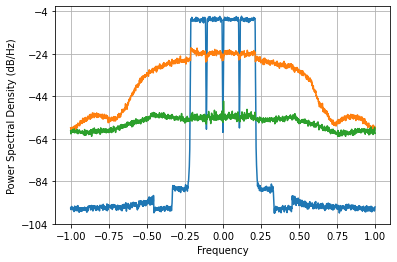

Loss =  2.6684342287015663e-06 Accuracy =  -40.782835238634114 dbs


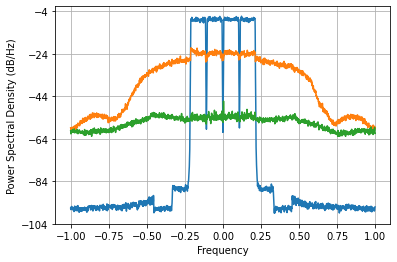

Loss =  2.6651780002646196e-06 Accuracy =  -40.78813806964984 dbs


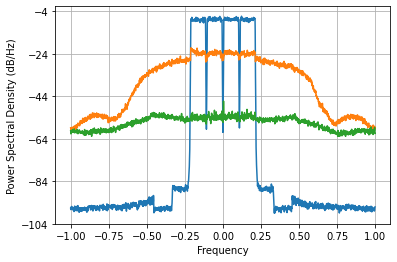

Loss =  2.665680731082082e-06 Accuracy =  -40.787318940006536 dbs


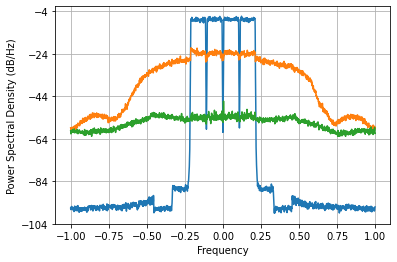

Loss =  2.6662860967056193e-06 Accuracy =  -40.78633278626832 dbs


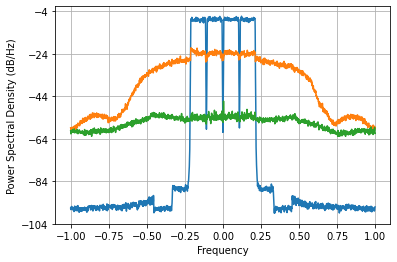

Loss =  2.6657389226208892e-06 Accuracy =  -40.78722413499834 dbs


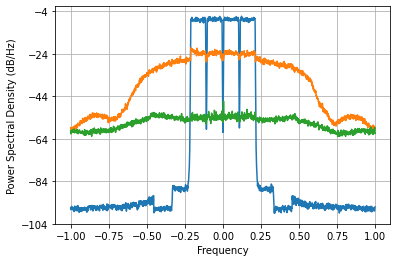

Loss =  2.6658220177286183e-06 Accuracy =  -40.78708876095998 dbs


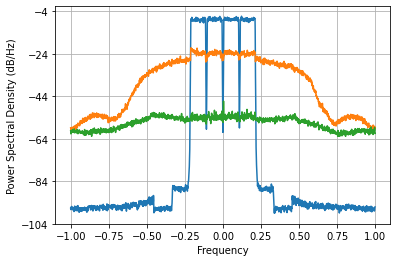

Loss =  2.6628723958948275e-06 Accuracy =  -40.791896710215525 dbs


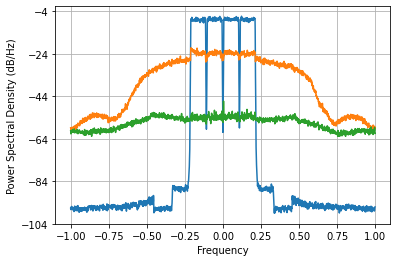

Loss =  2.6634375567030798e-06 Accuracy =  -40.79097507319659 dbs


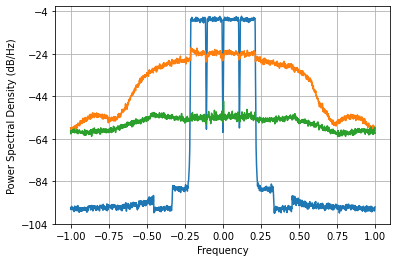

Loss =  2.6638738976676713e-06 Accuracy =  -40.79026364314337 dbs


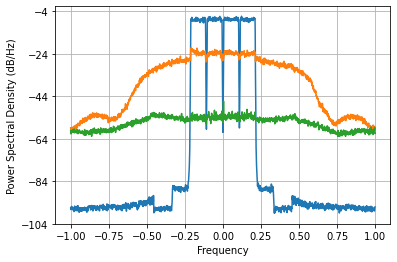

Loss =  2.6633826637094503e-06 Accuracy =  -40.79106458147073 dbs


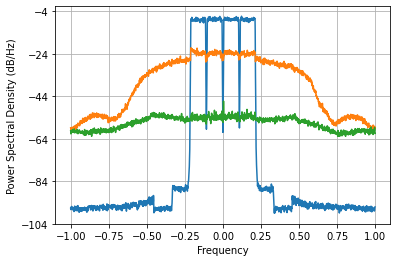

Loss =  2.6635162895884724e-06 Accuracy =  -40.79084669492015 dbs


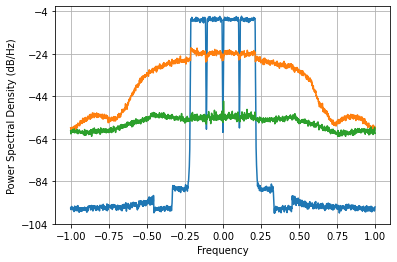

Loss =  2.660805994024691e-06 Accuracy =  -40.79526816472098 dbs


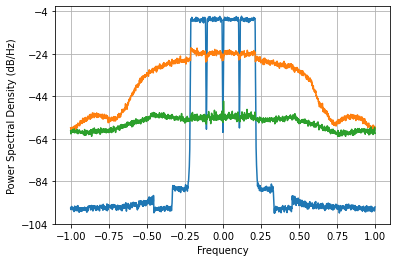

Loss =  2.6614027854760244e-06 Accuracy =  -40.794294196032475 dbs


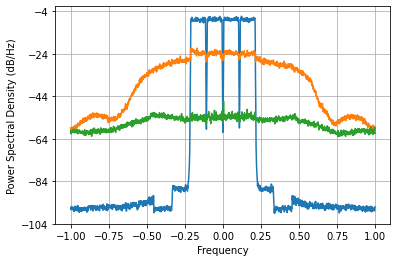

Loss =  2.6616609927691087e-06 Accuracy =  -40.793872867236374 dbs


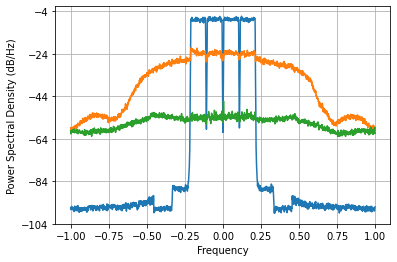

Loss =  2.6612221372167225e-06 Accuracy =  -40.794588992466 dbs


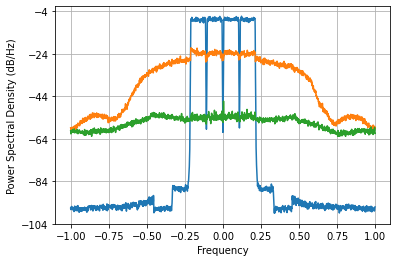

Loss =  2.661389785068858e-06 Accuracy =  -40.79431541047967 dbs


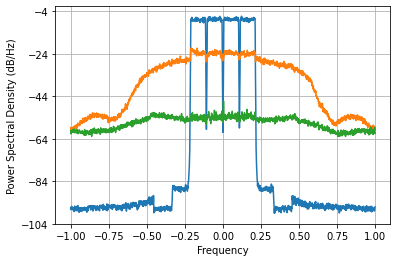

Loss =  2.6588745750954367e-06 Accuracy =  -40.79842175490061 dbs


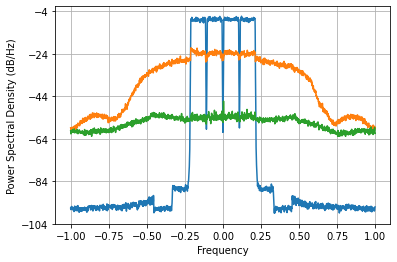

Loss =  2.659474404853474e-06 Accuracy =  -40.79744211721198 dbs



In [ ]:
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=0.96)
train(train_queue, valid_queue, net, loss_fn, optimizer,302,scheduler,save_flag=True)

После обучения с помощью функции my_train и оптимизатора Adam (со scheduler)получился результат -40.71 (пробовал обучить с помощью другого оптимизатора QHAdam, но это не принесло лучшего результата)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  0.13764731195829477 Accuracy =  6.342277080162072 dbs
cur_batch =  1000
Loss =  0.12108924925803177 Accuracy =  5.785655599298637 dbs
cur_batch =  1000
Loss =  0.10618911391450966 Accuracy =  5.215399701967101 dbs
cur_batch =  1000
Loss =  0.0940442475789993 Accuracy =  4.687922094437561 dbs
cur_batch =  1000
Loss =  0.08432757163015697 Accuracy =  4.214295674986131 dbs
cur_batch =  1000
Loss =  0.07639744802126318 Accuracy =  3.7853882496606577 dbs
cur_batch =  1000
Loss =  0.06963304449980735 Accuracy =  3.3827535714972057 dbs
cur_batch =  1000
Loss =  0.06354470154427072 Accuracy =  2.985393175642246 dbs
cur_batch =  1000
Loss =  0.05777267568863837 Accuracy =  2.5718245527071577 dbs
cur_batch =  1000
Loss =  0.05209572421716692 Accuracy =  2.1226205313541313 dbs
cur_batch =  1000
Loss =  0.04645428903932423 Accuracy =  1.6248579110576153 dbs
cur_batch =  1000
Loss =  0.040933023369527165 Accuracy =  1.0753379673079464 dbs
cur_batch =  1000
Loss =  0.03572368081052407 Accura

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  0.0013506099899816288 Accuracy =  -13.740100689704049 dbs
cur_batch =  2000
Loss =  0.0012232755660906971 Accuracy =  -14.170157255376115 dbs
cur_batch =  2000
Loss =  0.0011158397593711866 Accuracy =  -14.569381946471573 dbs
cur_batch =  2000
Loss =  0.0010182322941546002 Accuracy =  -14.966931597277055 dbs
cur_batch =  2000
Loss =  0.0009331860154103117 Accuracy =  -15.345718047915963 dbs
cur_batch =  2000
Loss =  0.0008565567296725073 Accuracy =  -15.71783895151042 dbs
cur_batch =  2000
Loss =  0.0007872350968600397 Accuracy =  -16.08435578926445 dbs
cur_batch =  2000
Loss =  0.0007230364404695189 Accuracy =  -16.453798407408456 dbs
cur_batch =  2000
Loss =  0.0006644828491974923 Accuracy =  -16.82056250732305 dbs
cur_batch =  2000
Loss =  0.0006124504298570724 Accuracy =  -17.174690828936715 dbs
cur_batch =  2000
Loss =  0.0005652126622638945 Accuracy =  -17.52328144053576 dbs
cur_batch =  2000
Loss =  0.0005230153852017594 Accuracy =  -17.860255622761226 dbs
cur_batch =  2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  0.00026832781730535394 Accuracy =  -20.758743287610336 dbs
cur_batch =  3000
Loss =  0.00025114069952034303 Accuracy =  -21.046229270984362 dbs
cur_batch =  3000
Loss =  0.0002373578841990177 Accuracy =  -21.29136364650038 dbs
cur_batch =  3000
Loss =  0.00022586677122351045 Accuracy =  -21.50687683044295 dbs
cur_batch =  3000
Loss =  0.00021523491587327446 Accuracy =  -21.716273017892483 dbs
cur_batch =  3000
Loss =  0.0002046405948916731 Accuracy =  -21.935482370546563 dbs
cur_batch =  3000
Loss =  0.00019447755479990751 Accuracy =  -22.156705412786202 dbs
cur_batch =  3000
Loss =  0.00018506771859194023 Accuracy =  -22.37209355423401 dbs
cur_batch =  3000
Loss =  0.00017677422847915257 Accuracy =  -22.571210762211038 dbs
cur_batch =  3000
Loss =  0.00016960153450461515 Accuracy =  -22.751102493815022 dbs
cur_batch =  3000
Loss =  0.00016226475815380413 Accuracy =  -22.9431581987049 dbs
cur_batch =  3000
Loss =  0.00015281847781337438 Accuracy =  -23.20364157218115 dbs
cur_ba

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  0.0001025184422498994 Accuracy =  -24.937380281558635 dbs
cur_batch =  4000
Loss =  0.00010132747523507903 Accuracy =  -24.988128051671147 dbs
cur_batch =  4000
Loss =  9.996155878684809e-05 Accuracy =  -25.047070068523873 dbs
cur_batch =  4000
Loss =  9.728078127593852e-05 Accuracy =  -25.165129768641556 dbs
cur_batch =  4000
Loss =  9.479472210718408e-05 Accuracy =  -25.277558689233253 dbs
cur_batch =  4000
Loss =  9.244053146800931e-05 Accuracy =  -25.386775929863102 dbs
cur_batch =  4000
Loss =  9.015803605362947e-05 Accuracy =  -25.49535583947005 dbs
cur_batch =  4000
Loss =  8.765402247347176e-05 Accuracy =  -25.61768175876813 dbs
cur_batch =  4000
Loss =  8.436405853154003e-05 Accuracy =  -25.78382562360298 dbs
cur_batch =  4000
Loss =  8.209394459425977e-05 Accuracy =  -25.902289027756993 dbs
cur_batch =  4000
Loss =  7.988263343902568e-05 Accuracy =  -26.02087653148741 dbs
cur_batch =  4000
Loss =  7.769020086351076e-05 Accuracy =  -26.14173782395452 dbs
cur_batch =  4

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  0.00010070618207504055 Accuracy =  -25.014838951746604 dbs
cur_batch =  5000
Loss =  6.27859332167782e-05 Accuracy =  -27.066776729293103 dbs
cur_batch =  5000
Loss =  6.155952520529784e-05 Accuracy =  -27.152447651310418 dbs
cur_batch =  5000
Loss =  5.706091156452612e-05 Accuracy =  -27.482013213321025 dbs
cur_batch =  5000
Loss =  5.4911339696997795e-05 Accuracy =  -27.6487798716906 dbs
cur_batch =  5000
Loss =  5.367023405684728e-05 Accuracy =  -27.748065374310936 dbs
cur_batch =  5000
Loss =  5.1543547687668286e-05 Accuracy =  -27.923657194164452 dbs
cur_batch =  5000
Loss =  4.959229226736978e-05 Accuracy =  -28.09125843864723 dbs
cur_batch =  5000
Loss =  4.787931547930902e-05 Accuracy =  -28.243920939280464 dbs
cur_batch =  5000
Loss =  4.620094392949413e-05 Accuracy =  -28.398891779896246 dbs
cur_batch =  5000
Loss =  4.463131770111043e-05 Accuracy =  -28.54900317488909 dbs
cur_batch =  5000
Loss =  4.3133233133562147e-05 Accuracy =  -28.69728013952919 dbs
cur_batch = 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  3.281537740937207e-05 Accuracy =  -29.88462623249486 dbs
cur_batch =  6000
Loss =  3.116322225783966e-05 Accuracy =  -30.10897669586054 dbs
cur_batch =  6000
Loss =  3.0571729551699626e-05 Accuracy =  -30.19220017680441 dbs
cur_batch =  6000
Loss =  2.9577576275797083e-05 Accuracy =  -30.335774436796157 dbs
cur_batch =  6000
Loss =  2.876147368695024e-05 Accuracy =  -30.457288919275413 dbs
cur_batch =  6000
Loss =  2.8055790129980346e-05 Accuracy =  -30.565175225221015 dbs
cur_batch =  6000
Loss =  2.835038112102853e-05 Accuracy =  -30.519811250943334 dbs
cur_batch =  6000
Loss =  2.6639844087152252e-05 Accuracy =  -30.790083479425085 dbs
cur_batch =  6000
Loss =  2.778546500333956e-05 Accuracy =  -30.607223573755622 dbs
cur_batch =  6000
Loss =  2.6905440148981844e-05 Accuracy =  -30.746999255775876 dbs
cur_batch =  6000
Loss =  2.490956978277963e-05 Accuracy =  -31.08173799857401 dbs
cur_batch =  6000
Loss =  2.662303533373025e-05 Accuracy =  -30.79282458136346 dbs
cur_batch 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  2.1056626424003144e-05 Accuracy =  -31.811512345206566 dbs
cur_batch =  7000
Loss =  2.1651918388968447e-05 Accuracy =  -31.69043645221339 dbs
cur_batch =  7000
Loss =  1.9799133076852833e-05 Accuracy =  -32.07893851991433 dbs
cur_batch =  7000
Loss =  1.949803463228131e-05 Accuracy =  -32.145491892422186 dbs
cur_batch =  7000
Loss =  1.9331181170296716e-05 Accuracy =  -32.18281635666932 dbs
cur_batch =  7000
Loss =  1.932929348193991e-05 Accuracy =  -32.18324046560484 dbs
cur_batch =  7000
Loss =  1.878610298355641e-05 Accuracy =  -32.30703327921803 dbs
cur_batch =  7000
Loss =  1.9128422202218845e-05 Accuracy =  -32.228608777340966 dbs
cur_batch =  7000
Loss =  1.8585251702387573e-05 Accuracy =  -32.35371579512193 dbs
cur_batch =  7000
Loss =  1.8275359257870272e-05 Accuracy =  -32.42674103593108 dbs
cur_batch =  7000
Loss =  1.9885771744607195e-05 Accuracy =  -32.059975765550426 dbs
cur_batch =  7000
Loss =  2.1326882397985798e-05 Accuracy =  -31.7561265254723 dbs
cur_batch 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  1.8913128895987183e-05 Accuracy =  -32.27776644334274 dbs
cur_batch =  8000
Loss =  1.6791968817028916e-05 Accuracy =  -32.79438407605366 dbs
cur_batch =  8000
Loss =  1.5517023790473247e-05 Accuracy =  -33.13731600701894 dbs
cur_batch =  8000
Loss =  1.5107863263688992e-05 Accuracy =  -33.253369811717526 dbs
cur_batch =  8000
Loss =  1.4854181653225814e-05 Accuracy =  -33.32691296046909 dbs
cur_batch =  8000
Loss =  1.4727349965538618e-05 Accuracy =  -33.36415419620423 dbs
cur_batch =  8000
Loss =  1.4664007745657733e-05 Accuracy =  -33.38287345335853 dbs
cur_batch =  8000
Loss =  1.6732581443349534e-05 Accuracy =  -32.80977079143807 dbs
cur_batch =  8000
Loss =  1.4546194550192965e-05 Accuracy =  -33.41790634879313 dbs
cur_batch =  8000
Loss =  1.3961175055219988e-05 Accuracy =  -33.59618054065735 dbs
cur_batch =  8000
Loss =  1.4832836574348806e-05 Accuracy =  -33.33315814918993 dbs
cur_batch =  8000
Loss =  1.3752418317999543e-05 Accuracy =  -33.661609525354315 dbs
cur_batc

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  1.3186916570531886e-05 Accuracy =  -33.84396768135844 dbs
cur_batch =  9000
Loss =  1.1889552574311778e-05 Accuracy =  -34.293745150605965 dbs
cur_batch =  9000
Loss =  1.1672595586760726e-05 Accuracy =  -34.37372587637951 dbs
cur_batch =  9000
Loss =  1.1666679947522927e-05 Accuracy =  -34.37592742674824 dbs
cur_batch =  9000
Loss =  1.1609262654139322e-05 Accuracy =  -34.39735389672113 dbs
cur_batch =  9000
Loss =  1.1557607462782167e-05 Accuracy =  -34.4167208648369 dbs
cur_batch =  9000
Loss =  1.1426019389640052e-05 Accuracy =  -34.46645069977311 dbs
cur_batch =  9000
Loss =  1.1298449429832213e-05 Accuracy =  -34.51521180574168 dbs
cur_batch =  9000
Loss =  1.1174258317397817e-05 Accuracy =  -34.5632131988212 dbs
cur_batch =  9000
Loss =  1.1054546554385071e-05 Accuracy =  -34.60999093700889 dbs
cur_batch =  9000
Loss =  1.0939475178983351e-05 Accuracy =  -34.65543539456712 dbs
cur_batch =  9000
Loss =  1.0828856104323532e-05 Accuracy =  -34.69957443914999 dbs
cur_batch =

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  1.2320504510618507e-05 Accuracy =  -34.13911534631619 dbs
cur_batch =  10000
Loss =  1.3449156407486752e-05 Accuracy =  -33.75844982428868 dbs
cur_batch =  10000
Loss =  1.0560197662263141e-05 Accuracy =  -34.80867979434877 dbs
cur_batch =  10000
Loss =  9.793057638042106e-06 Accuracy =  -35.13621716090047 dbs
cur_batch =  10000
Loss =  9.65129326703537e-06 Accuracy =  -35.19954514266261 dbs
cur_batch =  10000
Loss =  9.457643969718726e-06 Accuracy =  -35.28757065591706 dbs
cur_batch =  10000
Loss =  9.341693279865898e-06 Accuracy =  -35.34114422893881 dbs
cur_batch =  10000
Loss =  9.981425318543205e-06 Accuracy =  -35.05347464982037 dbs
cur_batch =  10000
Loss =  9.170101999329622e-06 Accuracy =  -35.42165860320325 dbs
cur_batch =  10000
Loss =  9.837390845554876e-06 Accuracy =  -35.11660100171044 dbs
cur_batch =  10000
Loss =  9.44858363952378e-06 Accuracy =  -35.29173314860511 dbs
cur_batch =  10000
Loss =  9.337547985875788e-06 Accuracy =  -35.34307180009625 dbs
cur_batch 

KeyboardInterrupt: ignored

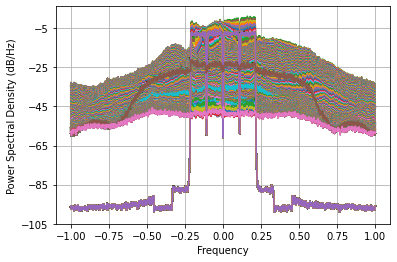

In [ ]:
net = Model(3,7,[[1,0,0,3,0,2,0],[0,1,0,1,0,1,4],[0,0,1,0,1,0,2]])
# net
net=net.to("cuda:0")
optimizer = torch.optim.Adam(net.parameters(), lr=1e-2)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=0.999)
my_train(train_queue, valid_queue, net, loss_fn, optimizer,102,X,D,scheduler,save_flag=False)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  1.1449913348033369e-05 Accuracy =  -34.45737826703451 dbs
cur_batch =  3000
Loss =  1.2463995220179861e-05 Accuracy =  -34.08882752907396 dbs
cur_batch =  3000
Loss =  9.533606499212465e-06 Accuracy =  -35.25282804285744 dbs
cur_batch =  3000
Loss =  9.680708362665483e-06 Accuracy =  -35.18632889757817 dbs
cur_batch =  3000
Loss =  8.309780134019496e-06 Accuracy =  -35.84950493619564 dbs
cur_batch =  3000
Loss =  8.305942749653697e-06 Accuracy =  -35.85151093364313 dbs
cur_batch =  3000
Loss =  8.209518698426584e-06 Accuracy =  -35.90222330317232 dbs
cur_batch =  3000
Loss =  7.319159088650833e-06 Accuracy =  -36.400788396376754 dbs
cur_batch =  3000
Loss =  8.910939100920667e-06 Accuracy =  -35.54616551062573 dbs
cur_batch =  3000
Loss =  6.955892864752613e-06 Accuracy =  -36.62187142346214 dbs
cur_batch =  3000
Loss =  6.94755306526969e-06 Accuracy =  -36.62708154093695 dbs
cur_batch =  3000
Loss =  7.032211104458646e-06 Accuracy =  -36.57448127062031 dbs
cur_batch =  3000
Lo

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  2.9555666201075246e-06 Accuracy =  -40.338992736549955 dbs
cur_batch =  4000
Loss =  2.899328268237685e-06 Accuracy =  -40.42242636785758 dbs
cur_batch =  4000
Loss =  2.7117947978134008e-06 Accuracy =  -40.712832034213164 dbs
cur_batch =  4000
Loss =  2.6010017222326497e-06 Accuracy =  -40.89399386927623 dbs
cur_batch =  4000
Loss =  2.5367873660065985e-06 Accuracy =  -41.0025596058598 dbs
cur_batch =  4000
Loss =  2.494503124840074e-06 Accuracy =  -41.07555974376173 dbs
cur_batch =  4000
Loss =  2.4621689555183237e-06 Accuracy =  -41.132221755211795 dbs
cur_batch =  4000
Loss =  2.433183314999971e-06 Accuracy =  -41.18365196962567 dbs
cur_batch =  4000
Loss =  2.406315851685753e-06 Accuracy =  -41.23187394689719 dbs
cur_batch =  4000
Loss =  2.3785228430457823e-06 Accuracy =  -41.28232700000595 dbs
cur_batch =  4000
Loss =  2.3511072329923438e-06 Accuracy =  -41.33267589126545 dbs
cur_batch =  4000
Loss =  2.5009589801024835e-06 Accuracy =  -41.06433458052989 dbs
cur_batch = 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  2.492650903098016e-06 Accuracy =  -41.07878567067041 dbs
cur_batch =  5000
Loss =  2.4516882113240726e-06 Accuracy =  -41.15074787885594 dbs
cur_batch =  5000
Loss =  2.268567675689828e-06 Accuracy =  -41.487882870622855 dbs
cur_batch =  5000
Loss =  2.232405122252005e-06 Accuracy =  -41.55767016354082 dbs
cur_batch =  5000
Loss =  2.1999367036243583e-06 Accuracy =  -41.62129841166993 dbs
cur_batch =  5000
Loss =  2.17332569080646e-06 Accuracy =  -41.67415212875249 dbs
cur_batch =  5000
Loss =  2.1532005454963496e-06 Accuracy =  -41.714555455194954 dbs
cur_batch =  5000
Loss =  2.139633390238938e-06 Accuracy =  -41.742006599912564 dbs
cur_batch =  5000
Loss =  2.1310689189191653e-06 Accuracy =  -41.75942531632738 dbs
cur_batch =  5000
Loss =  2.1253710682953812e-06 Accuracy =  -41.77105262257463 dbs
cur_batch =  5000
Loss =  2.1225610811131432e-06 Accuracy =  -41.77679829864732 dbs
cur_batch =  5000
Loss =  2.1257343514941413e-06 Accuracy =  -41.77031035968818 dbs
cur_batch =  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  2.072154062452029e-06 Accuracy =  -41.881179850815286 dbs
cur_batch =  6000
Loss =  2.065548044482114e-06 Accuracy =  -41.89504725603274 dbs
cur_batch =  6000
Loss =  2.0848091206715654e-06 Accuracy =  -41.854737283539414 dbs
cur_batch =  6000
Loss =  2.0937360701734064e-06 Accuracy =  -41.83618091700484 dbs
cur_batch =  6000
Loss =  2.0818854220358576e-06 Accuracy =  -41.86083202544867 dbs
cur_batch =  6000
Loss =  2.0680608724561506e-06 Accuracy =  -41.889767088124 dbs
cur_batch =  6000
Loss =  2.0826084458120185e-06 Accuracy =  -41.859324013914055 dbs
cur_batch =  6000
Loss =  2.137358814843065e-06 Accuracy =  -41.74662590052787 dbs
cur_batch =  6000
Loss =  2.245119858406296e-06 Accuracy =  -41.53300495400135 dbs
cur_batch =  6000
Loss =  2.280180715856216e-06 Accuracy =  -41.46570758289123 dbs
cur_batch =  6000
Loss =  2.2067185181037243e-06 Accuracy =  -41.60793087197007 dbs
cur_batch =  6000
Loss =  2.1446596052614053e-06 Accuracy =  -41.7318165477716 dbs
cur_batch =  60

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  2.0100403112493682e-06 Accuracy =  -42.01335259428141 dbs
cur_batch =  7000
Loss =  2.0100755658729016e-06 Accuracy =  -42.01327642290262 dbs
cur_batch =  7000
Loss =  2.010837555840672e-06 Accuracy =  -42.01163038862029 dbs
cur_batch =  7000
Loss =  2.009037939925619e-06 Accuracy =  -42.015518883746516 dbs
cur_batch =  7000
Loss =  2.006128063386477e-06 Accuracy =  -42.0218137345406 dbs
cur_batch =  7000
Loss =  2.0033919090351476e-06 Accuracy =  -42.027741112027435 dbs
cur_batch =  7000
Loss =  2.001242829571131e-06 Accuracy =  -42.03240237829971 dbs
cur_batch =  7000
Loss =  1.9999649402394344e-06 Accuracy =  -42.03517644221258 dbs
cur_batch =  7000
Loss =  2.000003141390308e-06 Accuracy =  -42.035093488805515 dbs
cur_batch =  7000
Loss =  2.0021462297041077e-06 Accuracy =  -42.03044233048245 dbs
cur_batch =  7000
Loss =  2.0075238634367917e-06 Accuracy =  -42.01879310248191 dbs
cur_batch =  7000
Loss =  2.0168310387120185e-06 Accuracy =  -41.99870510244743 dbs
cur_batch =  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  2.020177894553384e-06 Accuracy =  -41.9915041208263 dbs
cur_batch =  8000
Loss =  2.010510792083541e-06 Accuracy =  -42.01233618023366 dbs
cur_batch =  8000
Loss =  2.01340165409724e-06 Accuracy =  -42.00609605620868 dbs
cur_batch =  8000
Loss =  2.0308863635950268e-06 Accuracy =  -41.96854403157535 dbs
cur_batch =  8000
Loss =  2.0667981364240898e-06 Accuracy =  -41.89241965406008 dbs
cur_batch =  8000
Loss =  2.0693938728926807e-06 Accuracy =  -41.88696867804041 dbs
cur_batch =  8000
Loss =  2.0330819461371194e-06 Accuracy =  -41.963851428667596 dbs
cur_batch =  8000
Loss =  2.0144464654257243e-06 Accuracy =  -42.00384296328511 dbs
cur_batch =  8000
Loss =  2.0050765105800247e-06 Accuracy =  -42.02409077418449 dbs
cur_batch =  8000
Loss =  1.999251293464155e-06 Accuracy =  -42.03672641021487 dbs
cur_batch =  8000
Loss =  1.9952575154958843e-06 Accuracy =  -42.04541071356462 dbs
cur_batch =  8000
Loss =  1.9923414575043953e-06 Accuracy =  -42.05176254647931 dbs
cur_batch =  80

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  1.979898182992382e-06 Accuracy =  -42.07897169609296 dbs
cur_batch =  9000
Loss =  1.980053805219018e-06 Accuracy =  -42.07863034915478 dbs
cur_batch =  9000
Loss =  1.9797076767876176e-06 Accuracy =  -42.07938959522984 dbs
cur_batch =  9000
Loss =  1.9793477595999555e-06 Accuracy =  -42.08017922826977 dbs
cur_batch =  9000
Loss =  1.979010501884908e-06 Accuracy =  -42.08091927833752 dbs
cur_batch =  9000
Loss =  1.978695580561457e-06 Accuracy =  -42.08161042917312 dbs
cur_batch =  9000
Loss =  1.97840116471687e-06 Accuracy =  -42.0822566765871 dbs
cur_batch =  9000
Loss =  1.9781253177937906e-06 Accuracy =  -42.08286225219624 dbs
cur_batch =  9000
Loss =  1.977866314819968e-06 Accuracy =  -42.08343092661689 dbs
cur_batch =  9000
Loss =  1.9776226749584244e-06 Accuracy =  -42.0839659373215 dbs
cur_batch =  9000
Loss =  1.9773931316426923e-06 Accuracy =  -42.08447005361517 dbs
cur_batch =  9000
Loss =  1.977176597062191e-06 Accuracy =  -42.08494565414823 dbs
cur_batch =  9000
Lo

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  1.9753447636081402e-06 Accuracy =  -42.08897121224254 dbs
cur_batch =  10000
Loss =  1.9747509236266533e-06 Accuracy =  -42.09027701063051 dbs
cur_batch =  10000
Loss =  1.974538912872349e-06 Accuracy =  -42.09074329750536 dbs
cur_batch =  10000
Loss =  1.9743733390514433e-06 Accuracy =  -42.09110748790627 dbs
cur_batch =  10000
Loss =  1.9742328318535427e-06 Accuracy =  -42.0914165665943 dbs
cur_batch =  10000
Loss =  1.97410921616065e-06 Accuracy =  -42.09168850662717 dbs
cur_batch =  10000
Loss =  1.973998067890258e-06 Accuracy =  -42.091933034331426 dbs
cur_batch =  10000
Loss =  1.97389678970199e-06 Accuracy =  -42.09215585971001 dbs
cur_batch =  10000
Loss =  1.9738036863487756e-06 Accuracy =  -42.09236070945887 dbs
cur_batch =  10000
Loss =  1.973717563295048e-06 Accuracy =  -42.09255020947491 dbs
cur_batch =  10000
Loss =  1.9736375301327187e-06 Accuracy =  -42.092726317070756 dbs
cur_batch =  10000
Loss =  1.97356289434007e-06 Accuracy =  -42.09289055455261 dbs
cur_bat

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  1.9731629880126305e-06 Accuracy =  -42.093770661846875 dbs
cur_batch =  11000
Loss =  1.9733073992924297e-06 Accuracy =  -42.09345282329337 dbs
cur_batch =  11000
Loss =  1.9733557736604303e-06 Accuracy =  -42.0933463600855 dbs
cur_batch =  11000
Loss =  1.9733792872948153e-06 Accuracy =  -42.09329461178466 dbs
cur_batch =  11000
Loss =  1.9733935371134137e-06 Accuracy =  -42.09326325139044 dbs
cur_batch =  11000
Loss =  1.97340191328717e-06 Accuracy =  -42.093244817569435 dbs
cur_batch =  11000
Loss =  1.973406413726806e-06 Accuracy =  -42.093234913282544 dbs
cur_batch =  11000
Loss =  1.9734081752369208e-06 Accuracy =  -42.093231036667085 dbs
cur_batch =  11000
Loss =  1.973407928560669e-06 Accuracy =  -42.093231579535725 dbs
cur_batch =  11000
Loss =  1.9734061821917316e-06 Accuracy =  -42.09323542282994 dbs
cur_batch =  11000
Loss =  1.9734033083197136e-06 Accuracy =  -42.093241747466394 dbs
cur_batch =  11000
Loss =  1.9733995880410724e-06 Accuracy =  -42.09324993483489 db

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  1.973358347753195e-06 Accuracy =  -42.093340695047445 dbs
cur_batch =  12000
Loss =  1.9732724316243364e-06 Accuracy =  -42.09352978241215 dbs
cur_batch =  12000
Loss =  1.9732034257072073e-06 Accuracy =  -42.09368165912502 dbs
cur_batch =  12000
Loss =  1.9731530899702534e-06 Accuracy =  -42.09379244755843 dbs
cur_batch =  12000
Loss =  1.9731151704545407e-06 Accuracy =  -42.093875909884574 dbs
cur_batch =  12000
Loss =  1.9730848748728422e-06 Accuracy =  -42.093942592788665 dbs
cur_batch =  12000
Loss =  1.973059658261368e-06 Accuracy =  -42.09399809726968 dbs
cur_batch =  12000
Loss =  1.9730380798014733e-06 Accuracy =  -42.09404559435 dbs
cur_batch =  12000
Loss =  1.9730192425355384e-06 Accuracy =  -42.094087058119946 dbs
cur_batch =  12000
Loss =  1.97300255132518e-06 Accuracy =  -42.09412379841655 dbs
cur_batch =  12000
Loss =  1.9729875918732655e-06 Accuracy =  -42.09415672707163 dbs
cur_batch =  12000
Loss =  1.9729740642775125e-06 Accuracy =  -42.094186504148546 dbs
c

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  1.9728914114175306e-06 Accuracy =  -42.094368444872224 dbs
cur_batch =  13000
Loss =  1.972819617887912e-06 Accuracy =  -42.09452648753435 dbs
cur_batch =  13000
Loss =  1.972778386791708e-06 Accuracy =  -42.09461725419403 dbs
cur_batch =  13000
Loss =  1.9727546371171405e-06 Accuracy =  -42.094669537890795 dbs
cur_batch =  13000
Loss =  1.972738308027015e-06 Accuracy =  -42.0947054859147 dbs
cur_batch =  13000
Loss =  1.9727256861445872e-06 Accuracy =  -42.09473327283101 dbs
cur_batch =  13000
Loss =  1.9727152027673755e-06 Accuracy =  -42.094756351989986 dbs
cur_batch =  13000
Loss =  1.9727061092351887e-06 Accuracy =  -42.09477637150394 dbs
cur_batch =  13000
Loss =  1.9726980093855652e-06 Accuracy =  -42.09479420349219 dbs
cur_batch =  13000
Loss =  1.9726906737179685e-06 Accuracy =  -42.09481035318093 dbs
cur_batch =  13000
Loss =  1.9726839580243804e-06 Accuracy =  -42.09482513803124 dbs
cur_batch =  13000
Loss =  1.9726777648786514e-06 Accuracy =  -42.094838772517534 dbs

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


Loss =  1.972639538381952e-06 Accuracy =  -42.0949229308009 dbs
cur_batch =  14000


RuntimeError: ignored

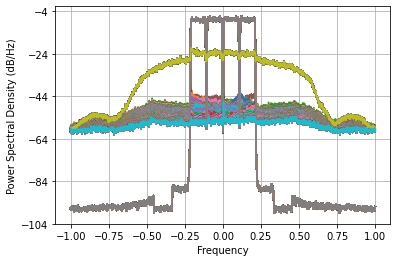

In [ ]:
optimizer = torch.optim.Adam(net.parameters(), lr=1e-2)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=0.95)
my_train(train_queue, valid_queue, net, loss_fn, optimizer,102,X,D,scheduler,save_flag=False)

Решил расширить модель Александра добавив больше клеток в одиен слой (увеличил их количество с 5 до 7). Подобрал задержки так чтобы стартовая точка была близка по accuracy к 0 и начал обучения используя функцию my_train. Оптимизатор QHAdam а затем доучивал с помощью простого Adam с маленьким шагом и используя scheduler. Получил результат -42.0